# Treg in PsA

In [1]:
suppressPackageStartupMessages({
    library(Seurat)
    library(dplyr)
    library(data.table)
    library(ggplot2)
    library(patchwork)
    library(harmony)
    library(symphony)
    library(presto)
    library(singlecellmethods)
    library(purrr)
    library(pheatmap)
    library(ggthemes)
})

set.seed(1)
source("utils.r")
source("myfun.r")

In [2]:
data.path <- "/data/brennerlab/Shani/projects/Treg/data/external_datasets/PsA_Penkava2020/"

In [3]:
# list.files(data.path, pattern = "matrix", recursive = T)
list.files(data.path, pattern = "CD4_CD8_matrix", recursive = T)

[1] "PSA1505_PBMC/PSA1505_PBMC_CD4_CD8_matrix.mtx"
[2] "PSA1505_SFMC/PSA1505_SFMC_CD4_CD8_matrix.mtx"
[3] "PSA1607_PBMC/PSA1607_PBMC_CD4_CD8_matrix.mtx"
[4] "PSA1607_SFMC/PSA1607_SFMC_CD4_CD8_matrix.mtx"
[5] "PSA1801_PBMC/PSA1801_PBMC_CD4_CD8_matrix.mtx"
[6] "PSA1801_SFMC/PSA1801_SFMC_CD4_CD8_matrix.mtx"

In [4]:
samples <- data.frame(sample_name = list.files(data.path, pattern = "matrix", recursive = T)) %>% 
    tidyr::separate(sample_name, sep = "/", into = c("sample", "file_name")) %>% 
    tidyr::separate(sample, sep = "_", into = c("donorID", "tissue", "0", "1","2"), remove = F) %>% 
    mutate(file_name = gsub("_matrix.mtx", "", file_name)) %>% 
    select(file_name, sample, tissue, donorID)
samples

Warning message:
“Expected 5 pieces. Missing pieces filled with `NA` in 8 rows [1, 2, 3, 4, 5, 6,
7, 8].”


file_name,sample,tissue,donorID
<chr>,<chr>,<chr>,<chr>
4040,4040_ST,ST,4040
BX245,BX245_ST,ST,BX245
PSA1505_PBMC_CD4_CD8,PSA1505_PBMC,PBMC,PSA1505
PSA1505_SFMC_CD4_CD8,PSA1505_SFMC,SFMC,PSA1505
PSA1607_PBMC_CD4_CD8,PSA1607_PBMC,PBMC,PSA1607
PSA1607_SFMC_CD4_CD8,PSA1607_SFMC,SFMC,PSA1607
PSA1801_PBMC_CD4_CD8,PSA1801_PBMC,PBMC,PSA1801
PSA1801_SFMC_CD4_CD8,PSA1801_SFMC,SFMC,PSA1801


In [5]:
mtx<-"_matrix.mtx"
bc<-"_barcodes.tsv"
ft<- "_genes.tsv"

## Synovial tissue samples

In [6]:
mtx<-"_matrix.mtx"
bc<-"_barcodes.tsv"
ft<- "_features.tsv"

In [7]:
#1samp
counts1 <- ReadMtx(mtx = paste0(data.path, samples$sample[1], "/", samples$file_name[1], mtx),
                  cells = paste0(data.path, samples$sample[1], "/", samples$file_name[1], bc),
                  features = paste0(data.path, samples$sample[1], "/", samples$file_name[1], ft))

counts2 <- ReadMtx(mtx = paste0(data.path, samples$sample[2], "/", samples$file_name[2], mtx),
                  cells = paste0(data.path, samples$sample[2], "/", samples$file_name[2], bc),
                  features = paste0(data.path, samples$sample[2], "/", samples$file_name[2], ft))

In [11]:
obj1 <- CreateSeuratObject(counts = counts1,  project = samples$sample[1])
obj1

obj2 <- CreateSeuratObject(counts = counts2,  project = samples$sample[2])
obj2



Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


An object of class Seurat 
33694 features across 671 samples within 1 assay 
Active assay: RNA (33694 features, 0 variable features)
 2 layers present: counts, data

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


An object of class Seurat 
33694 features across 1207 samples within 1 assay 
Active assay: RNA (33694 features, 0 variable features)
 2 layers present: counts, data

In [12]:
obj1@meta.data <- obj1@meta.data %>% tidyr::separate(orig.ident, sep = "_", into = c("donorID", "tissue"), remove = F)
obj1@meta.data %>% head

obj2@meta.data <- obj2@meta.data %>% tidyr::separate(orig.ident, sep = "_", into = c("donorID", "tissue"), remove = F)
obj2@meta.data %>% head

,orig.ident,donorID,tissue,nCount_RNA,nFeature_RNA
,<fct>,<chr>,<chr>,<dbl>,<int>
AAACCTGCATTCTTAC-1,4040_ST,4040,ST,1333,167
AAACCTGGTCAAAGAT-1,4040_ST,4040,ST,1142,427
AAACCTGGTCACCTAA-1,4040_ST,4040,ST,5911,1544
AAACCTGTCCGCATCT-1,4040_ST,4040,ST,6758,613
AAAGATGCAGCTTAAC-1,4040_ST,4040,ST,612,348
AAAGATGCAGTCAGAG-1,4040_ST,4040,ST,8432,2417


,orig.ident,donorID,tissue,nCount_RNA,nFeature_RNA
,<fct>,<chr>,<chr>,<dbl>,<int>
AAACCTGAGCTGAAAT-1,BX245_ST,BX245,ST,2395,607
AAACCTGTCGACAGCC-1,BX245_ST,BX245,ST,2196,900
AAACGGGAGGGCTTCC-1,BX245_ST,BX245,ST,584,246
AAACGGGGTTGAGTTC-1,BX245_ST,BX245,ST,1522,720
AAACGGGTCCAAACTG-1,BX245_ST,BX245,ST,3900,1381
AAACGGGTCCGTTGTC-1,BX245_ST,BX245,ST,1591,421


In [13]:
st.obj <- merge(obj1, obj2)
st.obj

Warning message:
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


An object of class Seurat 
33694 features across 1878 samples within 1 assay 
Active assay: RNA (33694 features, 0 variable features)
 2 layers present: counts, data

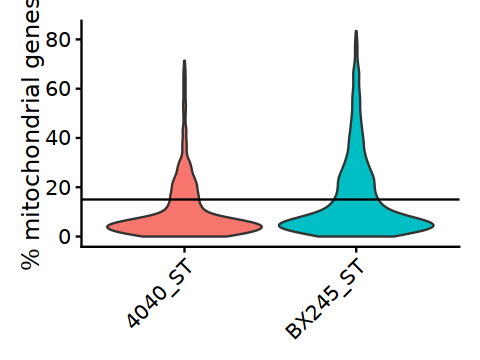

In [14]:
fig.size(3,4)
st.obj[["percent.mito"]] <- PercentageFeatureSet(st.obj, pattern = "^MT-")
VlnPlot(st.obj, features = "percent.mito", pt.size = 0.0, group.by = "orig.ident") + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("% mitochondrial genes") + geom_hline(yintercept=15)

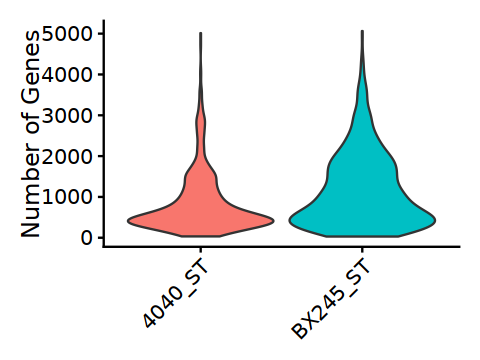

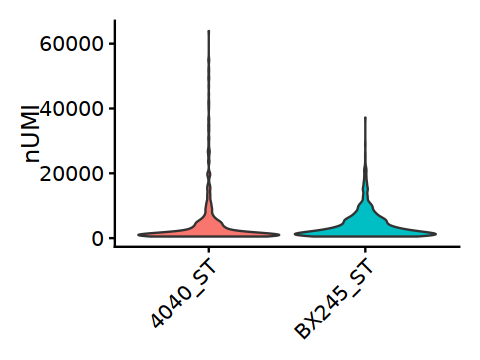

In [15]:
#Gene number
VlnPlot(st.obj, features = "nFeature_RNA", pt.size = 0.0, group.by = "orig.ident") + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("Number of Genes")
VlnPlot(st.obj, features = "nCount_RNA", pt.size = 0.0, group.by = "orig.ident") + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("nUMI")

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“The following aesthetics were dropped during statistical transformation:
colour.
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?”


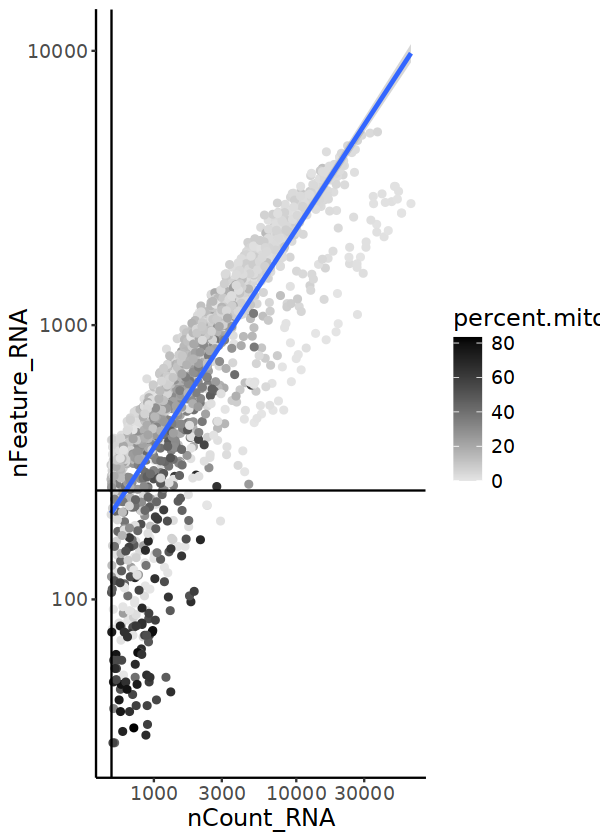

In [16]:
fig.size(7,5)
suppressMessages(
    st.obj@meta.data %>% 
  	ggplot(aes(x=nCount_RNA, y=nFeature_RNA, color=percent.mito)) + 
  	geom_point() + 
	scale_colour_gradient(low = "gray90", high = "black") +
  	stat_smooth(method=lm) +
  	scale_x_log10() + 
  	scale_y_log10() + 
  	theme_classic() +
  	geom_vline(xintercept = 500) +
  	geom_hline(yintercept = 250) +
    theme(text = element_text(size = 14)) 
    )

In [17]:
# data has already been cleaned
st.obj <- subset(st.obj, subset = nCount_RNA > 500 & nFeature_RNA > 250 &  percent.mito < 20)

### Normalization, DimRed, Clustering

In [18]:
#initial dimensionality reduction on all samples to identify contaminating clusters
st.obj <- NormalizeData(st.obj, normalization.method = "LogNormalize", scale.factor = 10000, verbose = F) %>% 
    FindVariableFeatures(selection.method = "vst", nfeatures = 2000, verbose = F) %>% 
    ScaleData() %>% 
    RunPCA(verbose = F)


Centering and scaling data matrix



In [19]:
st.obj

An object of class Seurat 
33694 features across 1339 samples within 1 assay 
Active assay: RNA (33694 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 1 dimensional reduction calculated: pca

In [20]:
st.obj@meta.data %>% head

,orig.ident,donorID,tissue,nCount_RNA,nFeature_RNA,percent.mito
,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>
AAACCTGGTCACCTAA-1_1,4040_ST,4040,ST,5911,1544,3.637286
AAACCTGTCCGCATCT-1_1,4040_ST,4040,ST,6758,613,1.050607
AAAGATGCAGCTTAAC-1_1,4040_ST,4040,ST,612,348,11.111111
AAAGATGCAGTCAGAG-1_1,4040_ST,4040,ST,8432,2417,11.242884
AAAGATGGTGACCAAG-1_1,4040_ST,4040,ST,5213,574,8.708997
AAAGCAAAGCGTCTAT-1_1,4040_ST,4040,ST,576,342,6.250000


Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



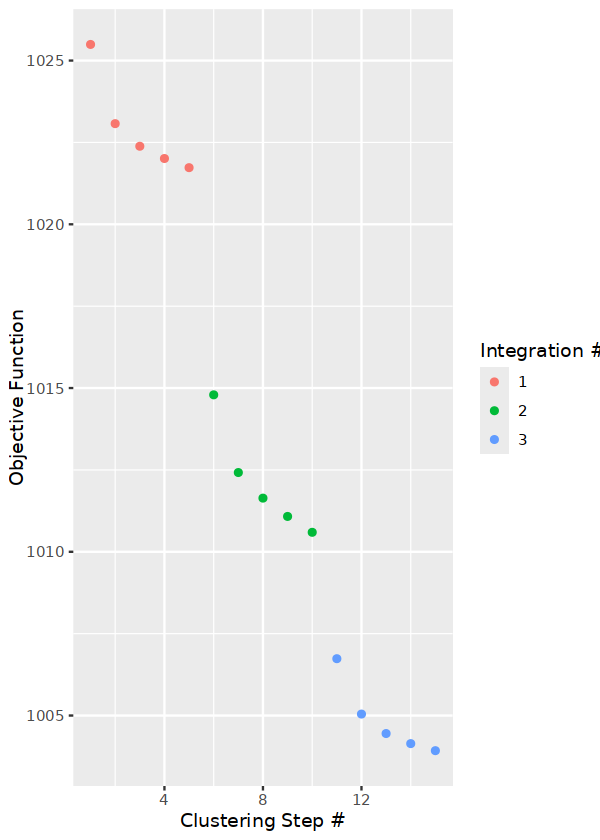

In [21]:
set.seed(1)
st.obj <- RunHarmony(st.obj, group.by.vars=c("donorID"), reduction.use = "pca", 
                 plot_convergence = TRUE, max_iter = 10,
                 early_stop = T)

# ElbowPlot(obj, ndims = 50, reduction = "harmony") 
# ElbowPlot(obj, ndims = 50, reduction = "pca") 

In [22]:
set.seed(1)
st.obj <- Run_uwot_umap(st.obj)
st.obj <- FindClusters(st.obj, graph.name = 'humap_fgraph', resolution = 1, verbose = TRUE)


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1339
Number of edges: 14871

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7828
Number of communities: 15
Elapsed time: 0 seconds


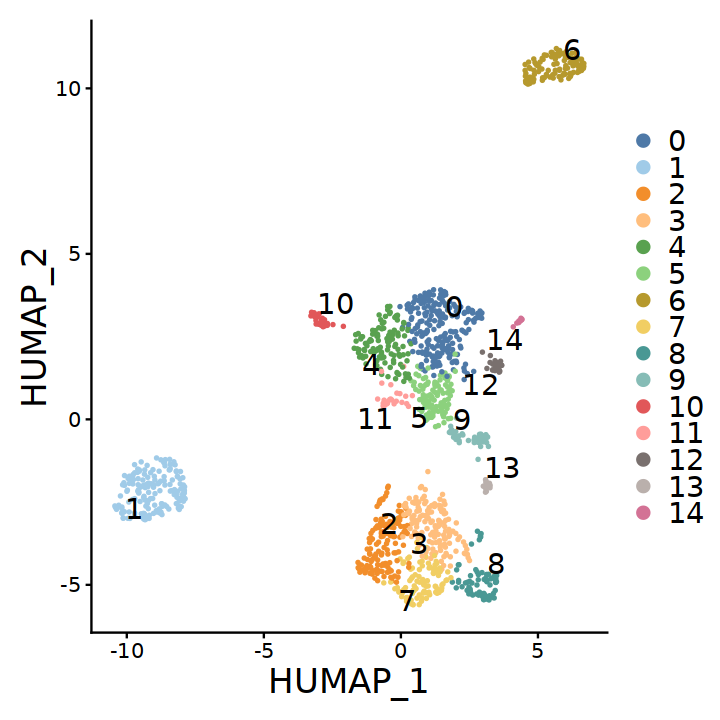

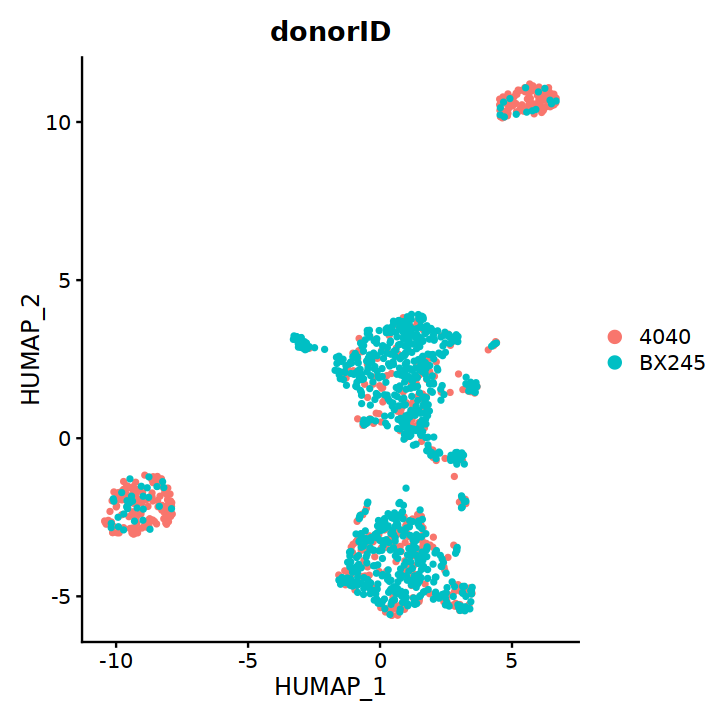

In [23]:
fig.size(6,6)
DimPlot(st.obj, label = T, repel = T, pt.size = 0.5, label.size = 6) + 
  scale_color_tableau("Tableau 20") + theme(text = element_text(size = 20))
DimPlot(st.obj, group.by = "donorID")


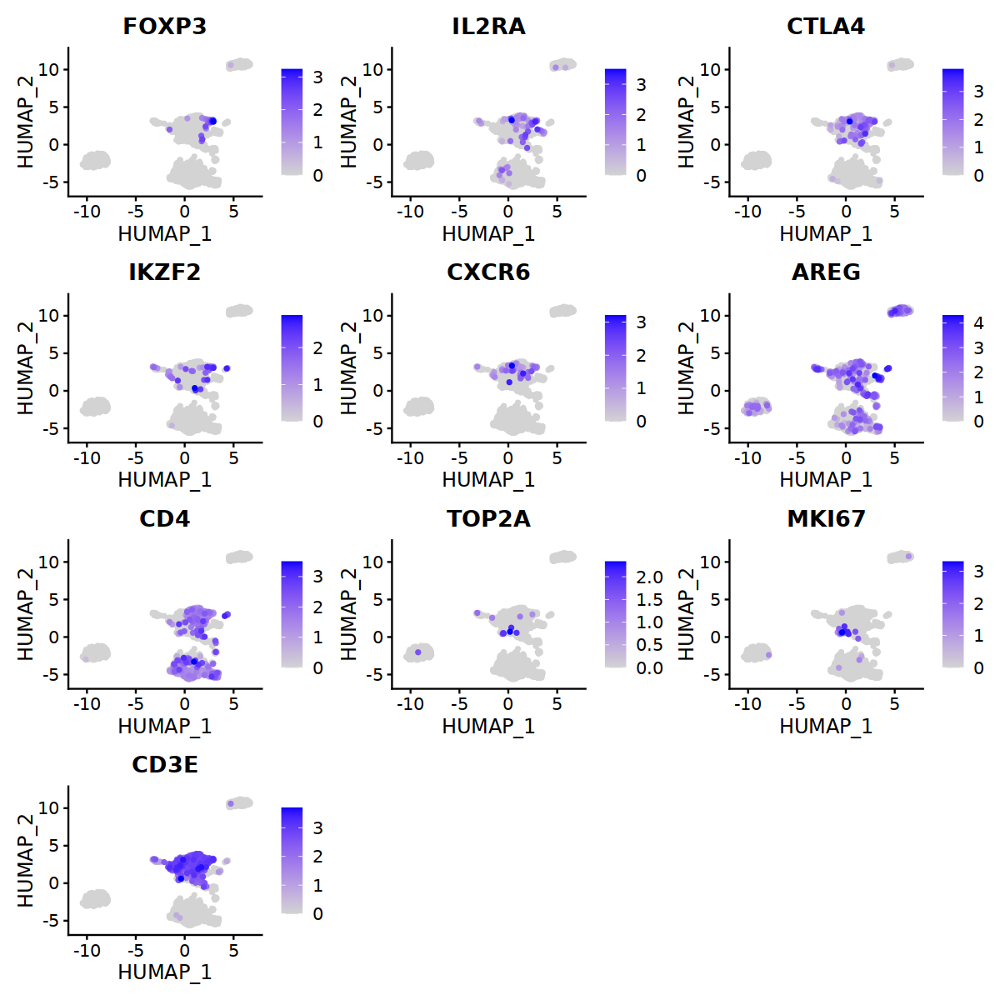

In [24]:
fig.size(10, 10)
FeaturePlot(st.obj, c("FOXP3", "IL2RA", "CTLA4", "IKZF2", "CXCR6", "AREG", "CD4", "TOP2A", "MKI67", "CD3E"), order =T, ncol = 3)

In [25]:
st.obj <- subset(st.obj, ident = c(0,4,5,11))

### filter CD4 T cells and redo preprocessing

In [26]:
#initial dimensionality reduction on all samples to identify contaminating clusters
st.obj <- NormalizeData(st.obj, normalization.method = "LogNormalize", scale.factor = 10000, verbose = F) %>% 
    FindVariableFeatures(selection.method = "vst", nfeatures = 2000, verbose = F) %>% 
    ScaleData() %>% 
    RunPCA(verbose = F)

Centering and scaling data matrix



Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony converged after 6 iterations



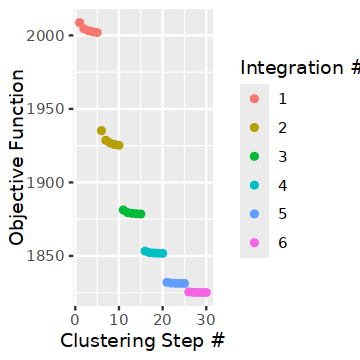

In [27]:
fig.size(3,3)
set.seed(1)
st.obj <- RunHarmony(st.obj, group.by.vars=c("donorID"), reduction.use = "pca", 
                 plot_convergence = TRUE, max_iter = 10,
                 early_stop = T)


In [28]:
set.seed(1)
st.obj <- Run_uwot_umap(st.obj)
st.obj <- FindClusters(st.obj, graph.name = 'humap_fgraph', resolution = 1, verbose = TRUE)


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 473
Number of edges: 5637

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6243
Number of communities: 8
Elapsed time: 0 seconds


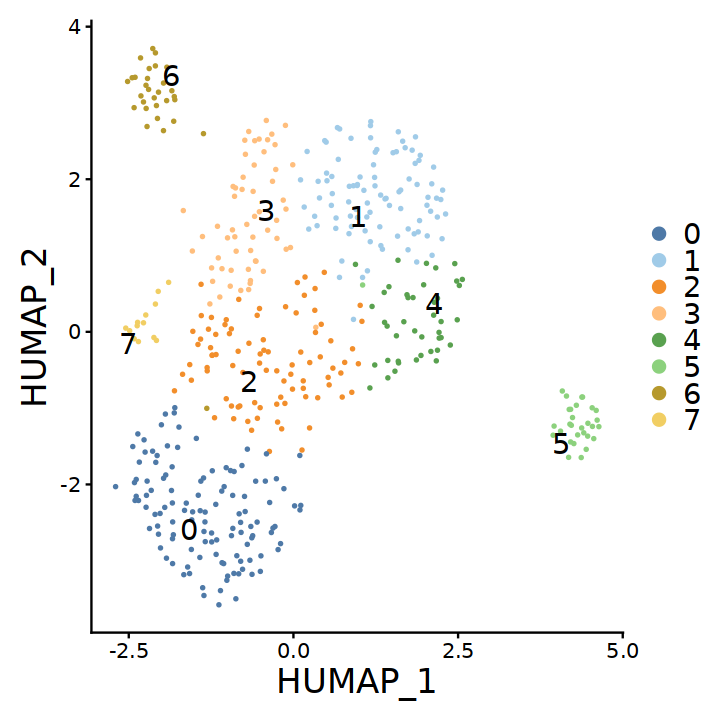

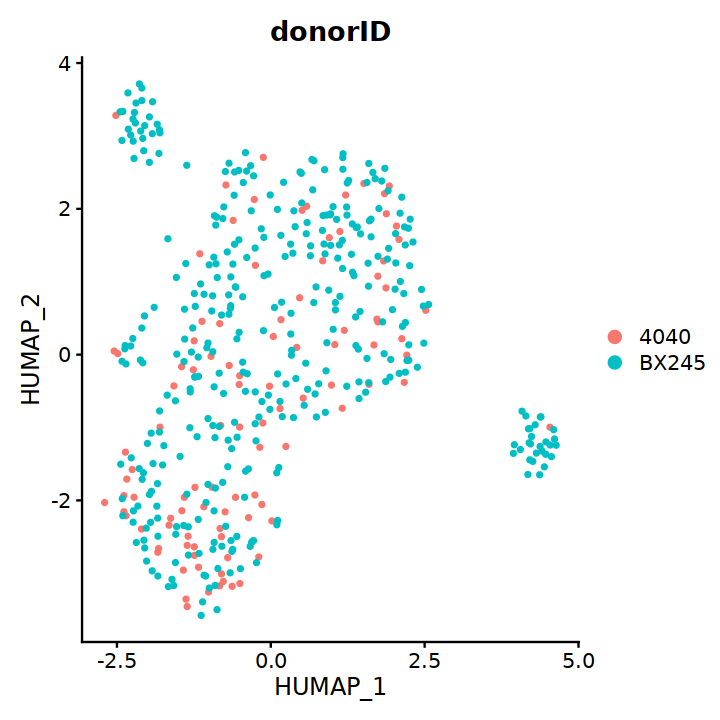

In [29]:
fig.size(6,6)
DimPlot(st.obj, label = T, repel = T, pt.size = 0.5, label.size = 6) + 
  scale_color_tableau("Tableau 20") + theme(text = element_text(size = 20))
DimPlot(st.obj, group.by = "donorID")


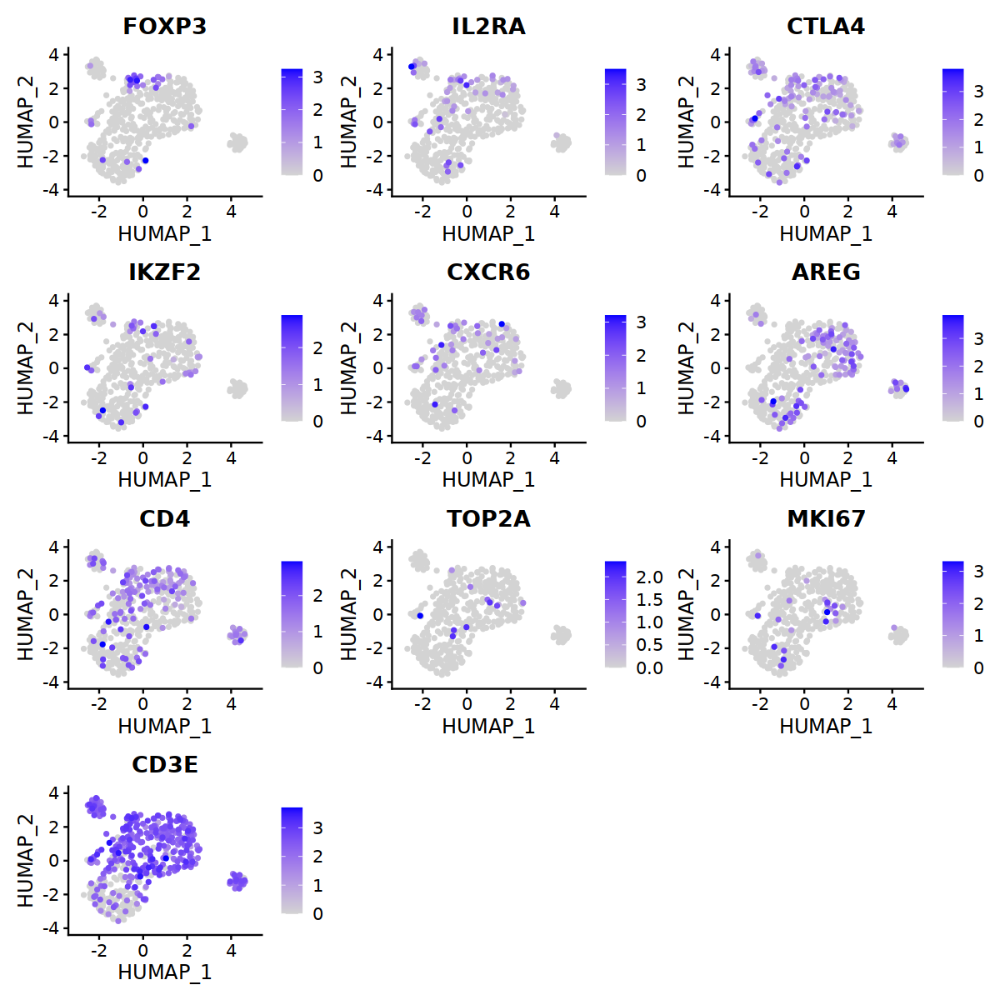

In [30]:
fig.size(10, 10)
FeaturePlot(st.obj, c("FOXP3", "IL2RA", "CTLA4", "IKZF2", "CXCR6", "AREG", "CD4", "TOP2A", "MKI67", "CD3E"), order =T, ncol = 3)

Dropping Synovial tissue because not enough Tregs to include.

## Synovial  Fluid and blood

In [44]:
samples <- samples[2:8,]
samples

,file_name,sample,tissue,donorID
,<chr>,<chr>,<chr>,<chr>
3,PSA1505_PBMC_CD4_CD8,PSA1505_PBMC,PBMC,PSA1505
4,PSA1505_SFMC_CD4_CD8,PSA1505_SFMC,SFMC,PSA1505
5,PSA1607_PBMC_CD4_CD8,PSA1607_PBMC,PBMC,PSA1607
6,PSA1607_SFMC_CD4_CD8,PSA1607_SFMC,SFMC,PSA1607
7,PSA1801_PBMC_CD4_CD8,PSA1801_PBMC,PBMC,PSA1801
8,PSA1801_SFMC_CD4_CD8,PSA1801_SFMC,SFMC,PSA1801


In [45]:
mtx<-"_matrix.mtx"
bc<-"_barcodes.tsv"
ft<- "_genes.tsv"


Obj.list <- c()
for (i in seq(1,dim(samples)[1])) {
    gexData <- ReadMtx(mtx = paste0(data.path, samples$sample[i], "/", samples$file_name[i], mtx),
                  cells = paste0(data.path, samples$sample[i], "/", samples$file_name[i], bc),
                  features = paste0(data.path, samples$sample[i], "/", samples$file_name[i], ft))
    tempRNA <- suppressWarnings(CreateSeuratObject(counts = gexData,  project = samples$sample[i]))
    tempRNA@meta.data <- tempRNA@meta.data %>% tidyr::separate(orig.ident, sep = "_", into = c("donorID", "tissue"), remove = F)

    #add obj to list of objects
    Obj.list <- c(Obj.list, tempRNA)
    }
                                

In [50]:
summary(Obj.list)

     Length Class  Mode
[1,] 1      Seurat S4  
[2,] 1      Seurat S4  
[3,] 1      Seurat S4  
[4,] 1      Seurat S4  
[5,] 1      Seurat S4  
[6,] 1      Seurat S4  

In [52]:
obj <- merge(Obj.list[[1]], 
                c(Obj.list[[2]], Obj.list[[3]], Obj.list[[4]], Obj.list[[5]], Obj.list[[6]]))
obj
         

Warning message:
“Some cell names are duplicated across objects provided. Renaming to enforce unique cell names.”


An object of class Seurat 
33694 features across 65331 samples within 1 assay 
Active assay: RNA (33694 features, 0 variable features)
 2 layers present: counts, data

In [54]:
obj@meta.data %>% tail

obj$tissue <- if_else(obj$tissue == "SFMC", "Syn.Fluid", "Blood")

,orig.ident,donorID,tissue,nCount_RNA,nFeature_RNA
,<chr>,<chr>,<chr>,<dbl>,<int>
TTTGTCAGTAGAAGGA-1_6,PSA1801_SFMC,PSA1801,SFMC,5708,1662
TTTGTCAGTGTGGCTC-1_6,PSA1801_SFMC,PSA1801,SFMC,5319,1654
TTTGTCAGTTCCCGAG-1_6,PSA1801_SFMC,PSA1801,SFMC,10758,2490
TTTGTCAGTTGTACAC-1_6,PSA1801_SFMC,PSA1801,SFMC,7003,1901
TTTGTCAGTTTGGGCC-1_6,PSA1801_SFMC,PSA1801,SFMC,3988,1527
TTTGTCATCGTTACGA-1_6,PSA1801_SFMC,PSA1801,SFMC,9021,2486


In [55]:
obj@meta.data %>% tail

,orig.ident,donorID,tissue,nCount_RNA,nFeature_RNA
,<chr>,<chr>,<chr>,<dbl>,<int>
TTTGTCAGTAGAAGGA-1_6,PSA1801_SFMC,PSA1801,Syn.Fluid,5708,1662
TTTGTCAGTGTGGCTC-1_6,PSA1801_SFMC,PSA1801,Syn.Fluid,5319,1654
TTTGTCAGTTCCCGAG-1_6,PSA1801_SFMC,PSA1801,Syn.Fluid,10758,2490
TTTGTCAGTTGTACAC-1_6,PSA1801_SFMC,PSA1801,Syn.Fluid,7003,1901
TTTGTCAGTTTGGGCC-1_6,PSA1801_SFMC,PSA1801,Syn.Fluid,3988,1527
TTTGTCATCGTTACGA-1_6,PSA1801_SFMC,PSA1801,Syn.Fluid,9021,2486


## Basic QC

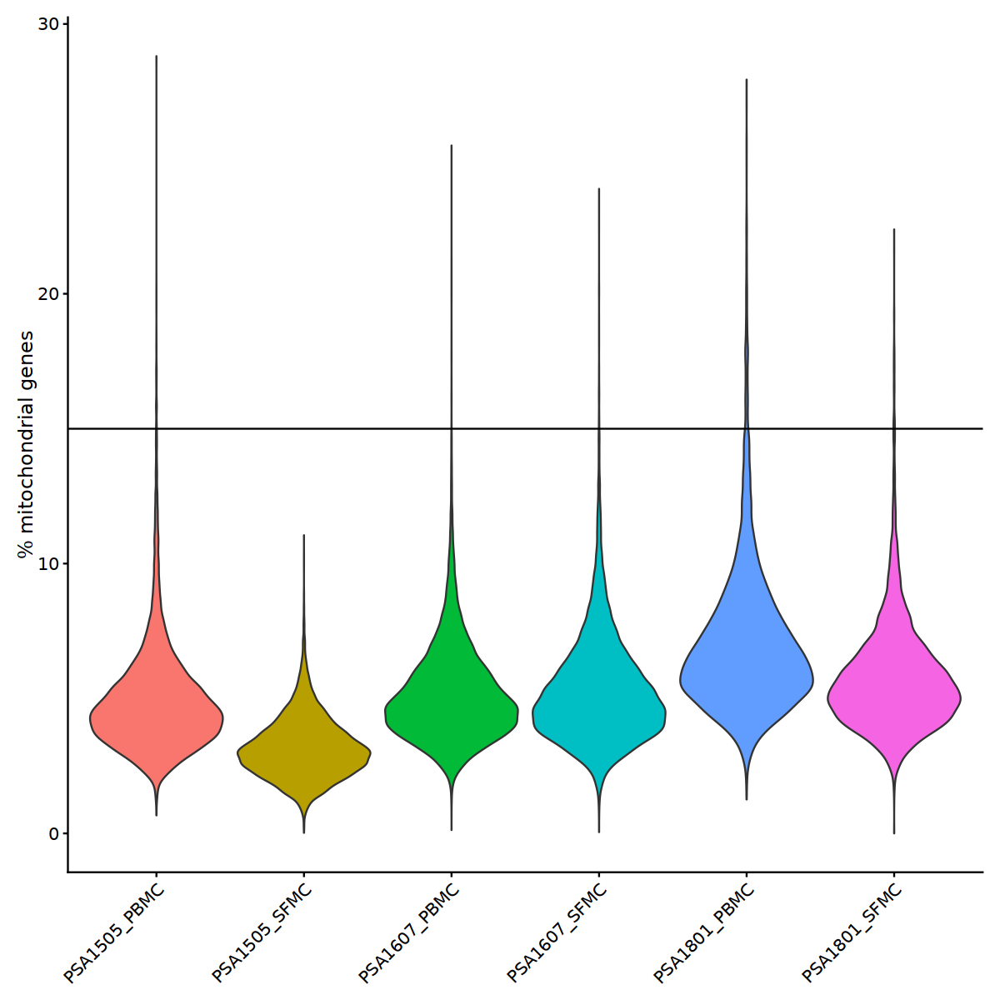

In [56]:
obj[["percent.mito"]] <- PercentageFeatureSet(obj, pattern = "^MT-")
VlnPlot(obj, features = "percent.mito", pt.size = 0.0, group.by = "orig.ident") + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("% mitochondrial genes") + geom_hline(yintercept=15)

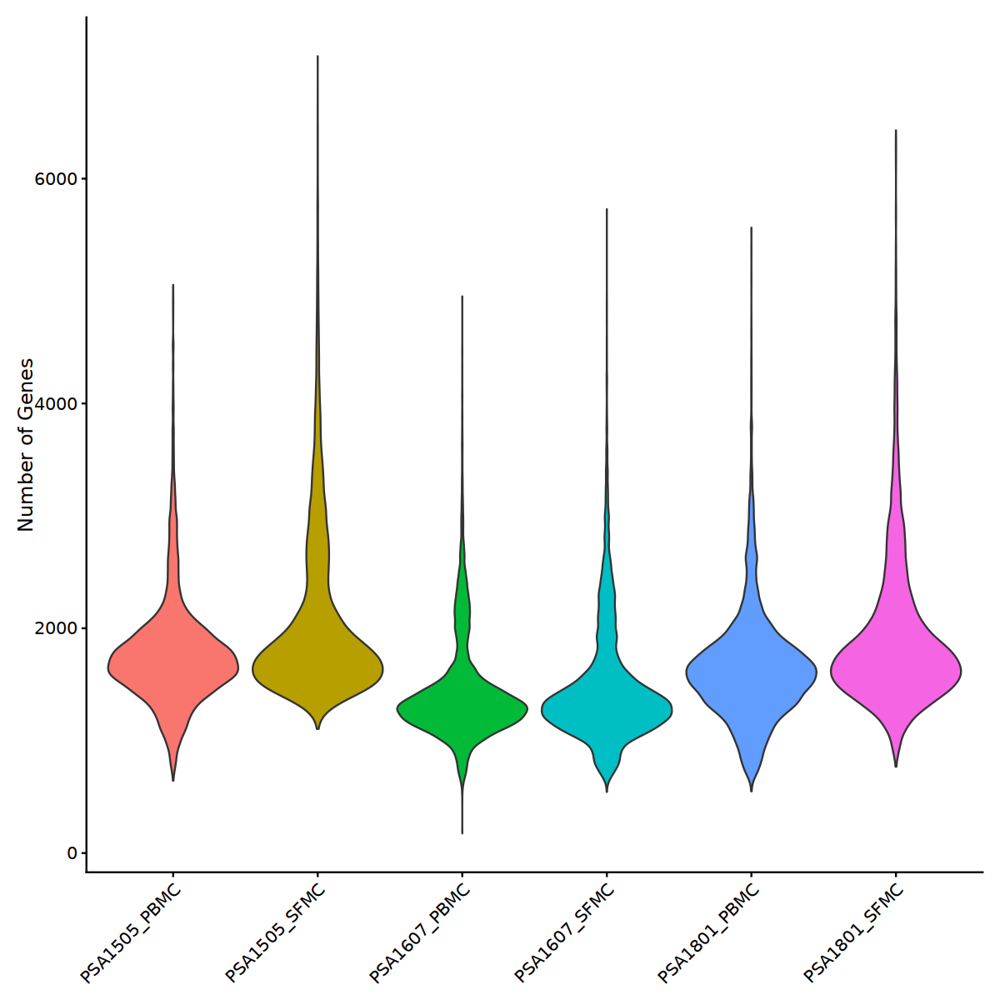

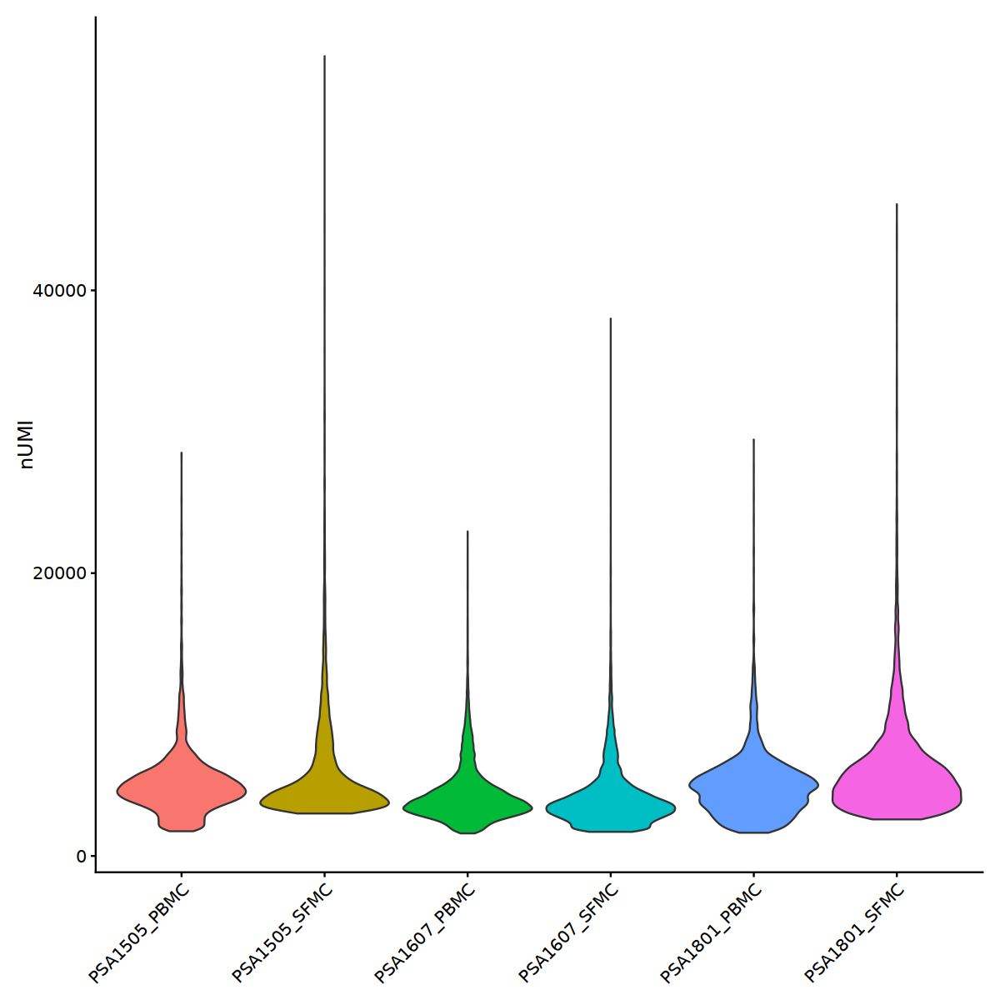

In [57]:
#Gene number
VlnPlot(obj, features = "nFeature_RNA", pt.size = 0.0, group.by = "orig.ident") + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("Number of Genes")
VlnPlot(obj, features = "nCount_RNA", pt.size = 0.0, group.by = "orig.ident") + theme(legend.position = "none") + ggtitle(NULL) +
  xlab(NULL) + ylab("nUMI")

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“The following aesthetics were dropped during statistical transformation:
colour.
ℹ This can happen when ggplot fails to infer the correct grouping structure in
  the data.
ℹ Did you forget to specify a `group` aesthetic or to convert a numerical
  variable into a factor?”


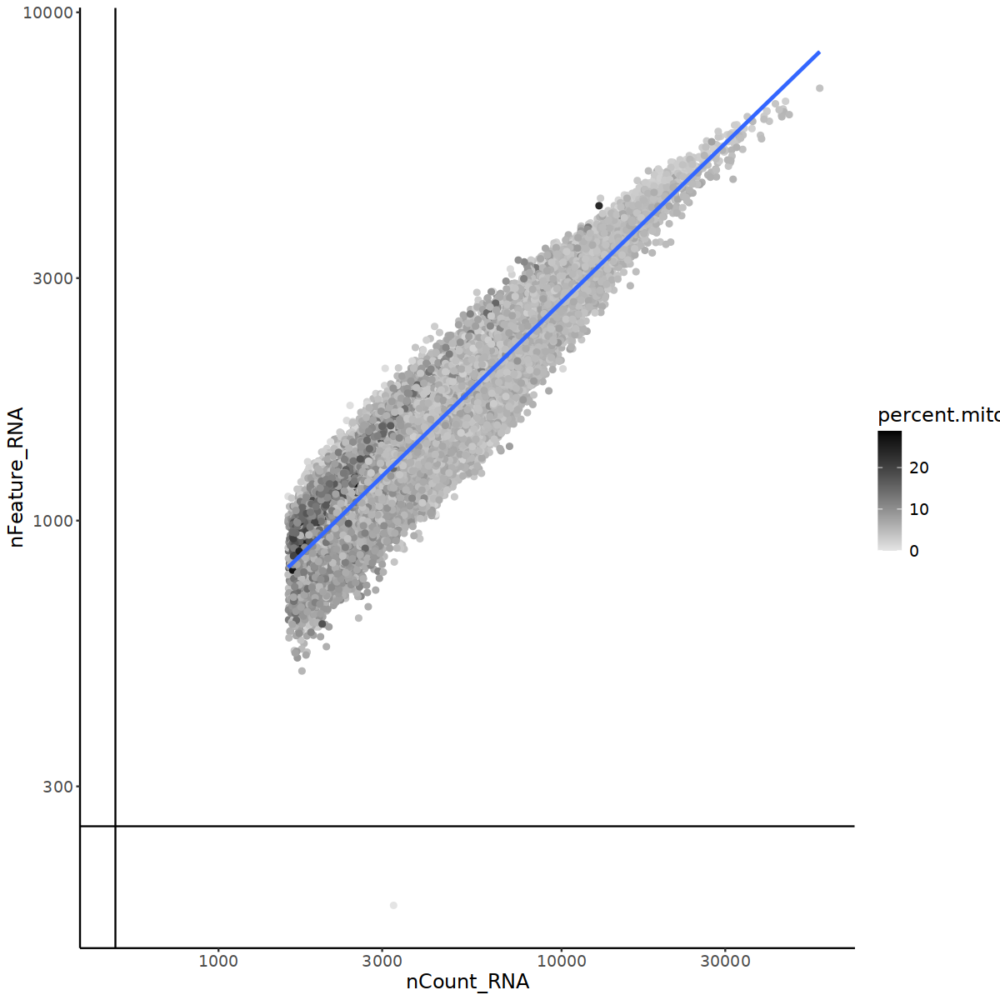

In [58]:
suppressMessages(
    obj@meta.data %>% 
  	ggplot(aes(x=nCount_RNA, y=nFeature_RNA, color=percent.mito)) + 
  	geom_point() + 
	scale_colour_gradient(low = "gray90", high = "black") +
  	stat_smooth(method=lm) +
  	scale_x_log10() + 
  	scale_y_log10() + 
  	theme_classic() +
  	geom_vline(xintercept = 500) +
  	geom_hline(yintercept = 250) +
    theme(text = element_text(size = 14)) 
    )

In [ ]:
# data has already been cleaned
# st.obj <- subset(st.obj, subset = nCount_RNA > 500 & nFeature_RNA > 250 &  percent.mito < 20)

## Normalization, DimRed, Clustering


In [59]:
#initial dimensionality reduction on all samples to identify contaminating clusters
obj <- NormalizeData(obj, normalization.method = "LogNormalize", scale.factor = 10000, verbose = F) %>% 
    FindVariableFeatures(selection.method = "vst", nfeatures = 2000, verbose = F) %>% 
    ScaleData() %>% 
    RunPCA(verbose = F)


Centering and scaling data matrix



In [60]:
obj

An object of class Seurat 
33694 features across 65331 samples within 1 assay 
Active assay: RNA (33694 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 1 dimensional reduction calculated: pca

In [61]:
obj@meta.data %>% head

,orig.ident,donorID,tissue,nCount_RNA,nFeature_RNA,percent.mito
,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>
AAACCTGAGAGCAATT-1_1,PSA1505_PBMC,PSA1505,Blood,2645,1435,9.829868
AAACCTGAGGAACTGC-1_1,PSA1505_PBMC,PSA1505,Blood,3722,1528,5.991402
AAACCTGAGGAATGGA-1_1,PSA1505_PBMC,PSA1505,Blood,5302,1786,4.696341
AAACCTGAGGGTCTCC-1_1,PSA1505_PBMC,PSA1505,Blood,3923,1495,7.672699
AAACCTGAGTAGCCGA-1_1,PSA1505_PBMC,PSA1505,Blood,12740,3101,3.924647
AAACCTGAGTTGTCGT-1_1,PSA1505_PBMC,PSA1505,Blood,3666,1417,4.828151


Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



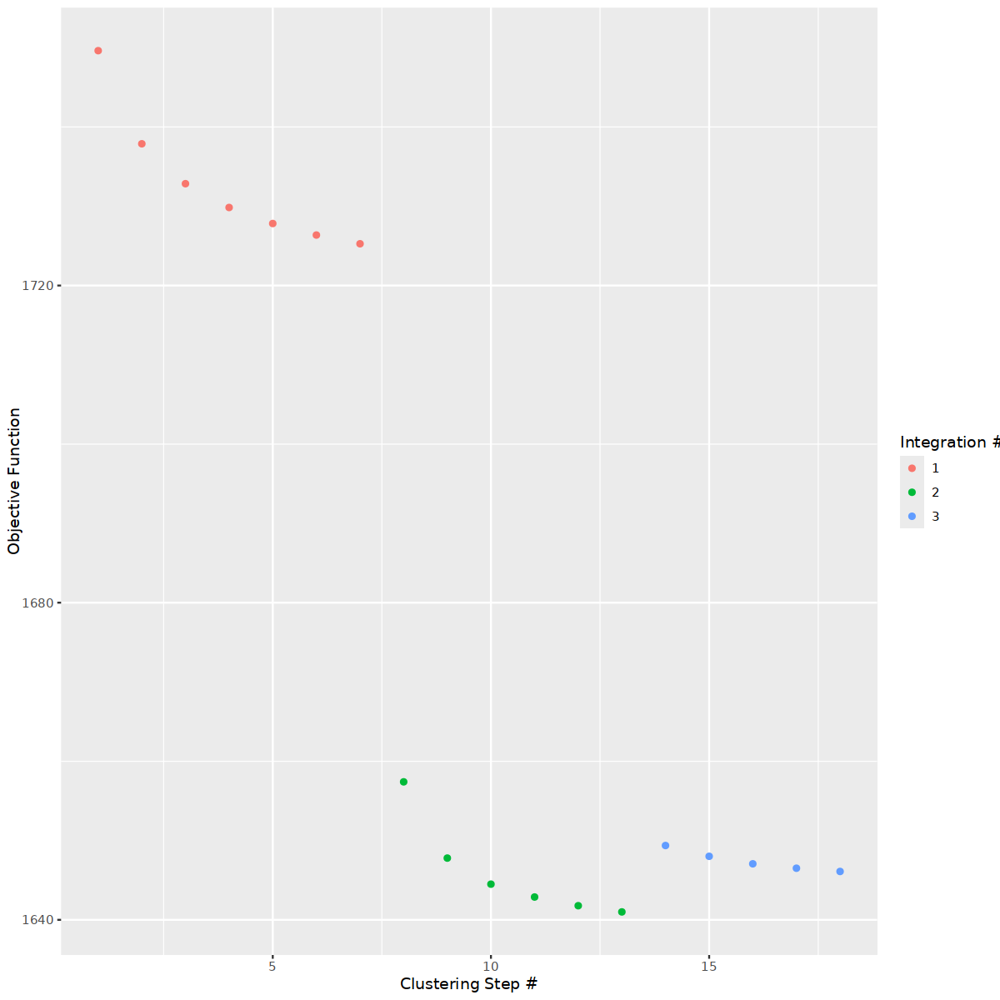

In [62]:
set.seed(1)
obj <- RunHarmony(obj, group.by.vars=c("donorID", "tissue"), reduction.use = "pca", 
                 plot_convergence = TRUE, max_iter = 10,
                 early_stop = T)

# ElbowPlot(obj, ndims = 50, reduction = "harmony") 
# ElbowPlot(obj, ndims = 50, reduction = "pca") 

In [63]:
set.seed(1)
obj <- Run_uwot_umap(obj)
obj <- FindClusters(obj, graph.name = 'humap_fgraph', resolution = 1, verbose = TRUE)


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 65331
Number of edges: 782922

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7397
Number of communities: 16
Elapsed time: 11 seconds


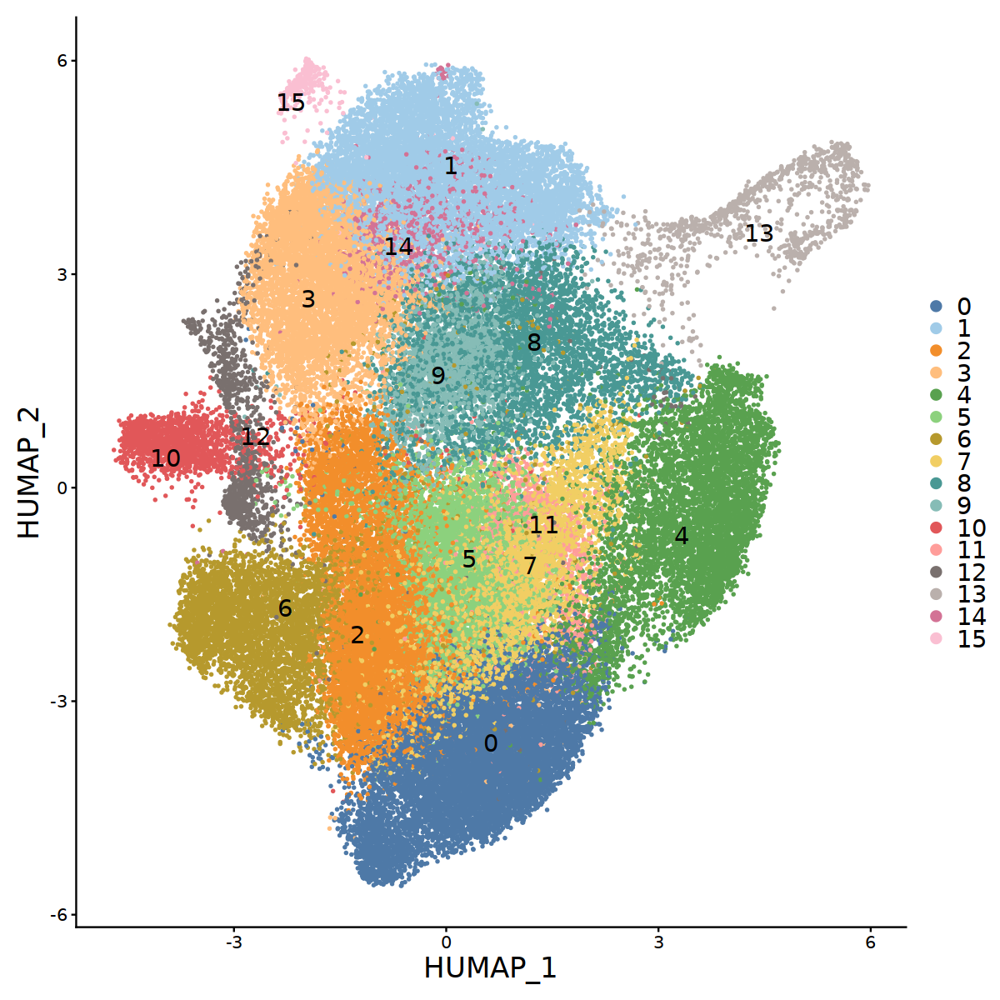

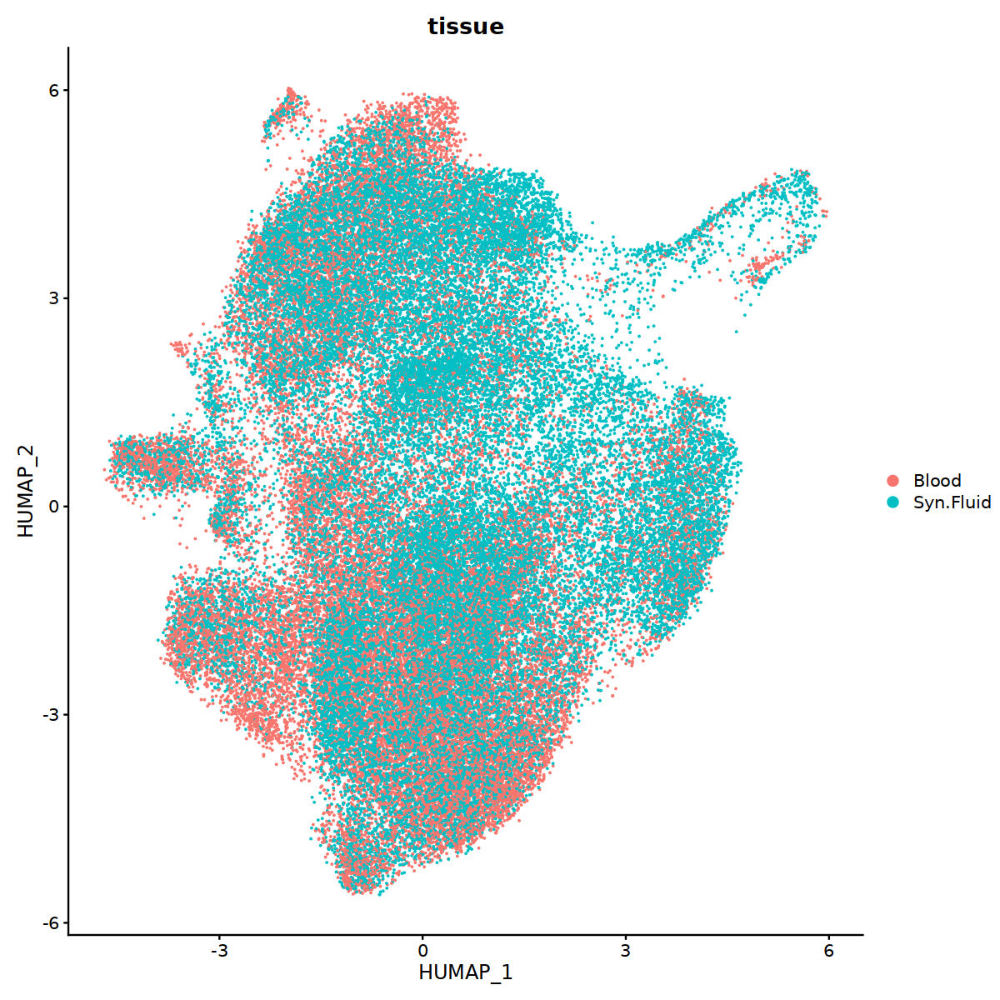

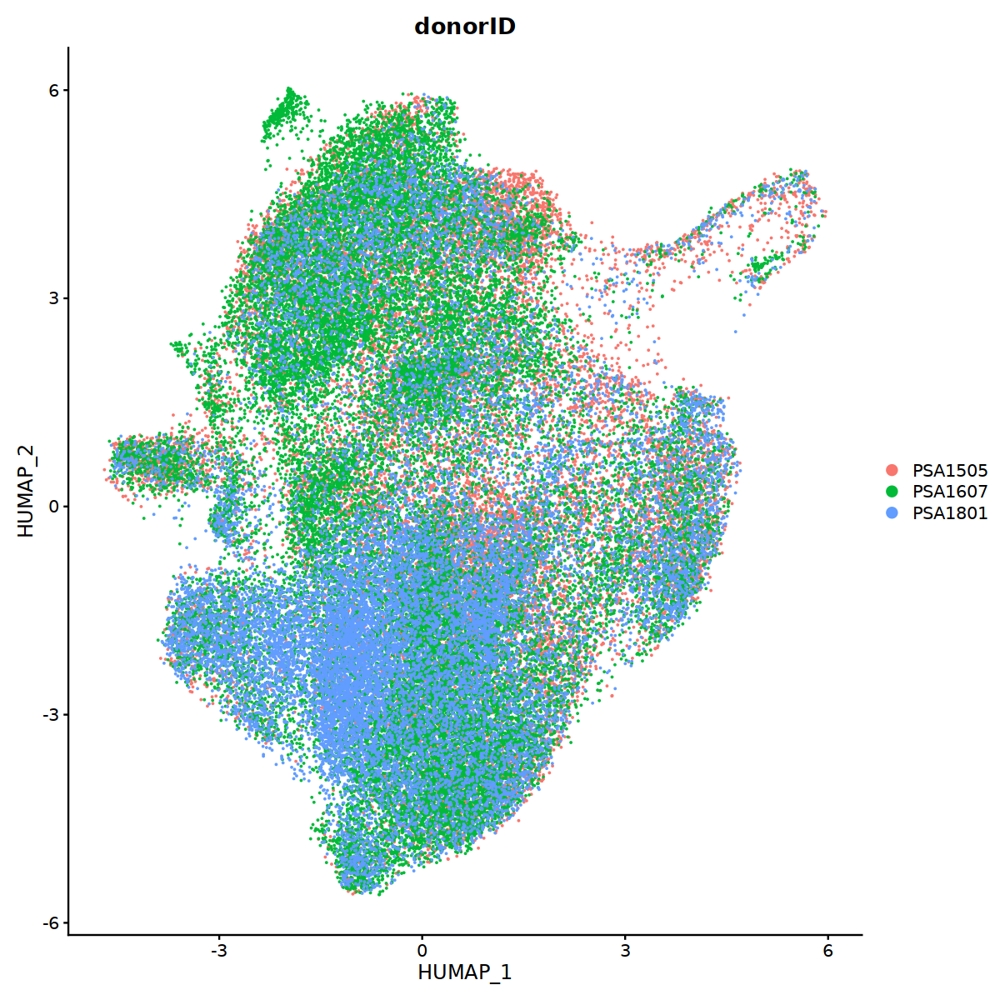

In [64]:
DimPlot(obj, label = T, repel = T, pt.size = 0.5, label.size = 6) + 
  scale_color_tableau("Tableau 20") + theme(text = element_text(size = 20))
DimPlot(obj, group.by = "tissue")
DimPlot(obj, group.by = "donorID")


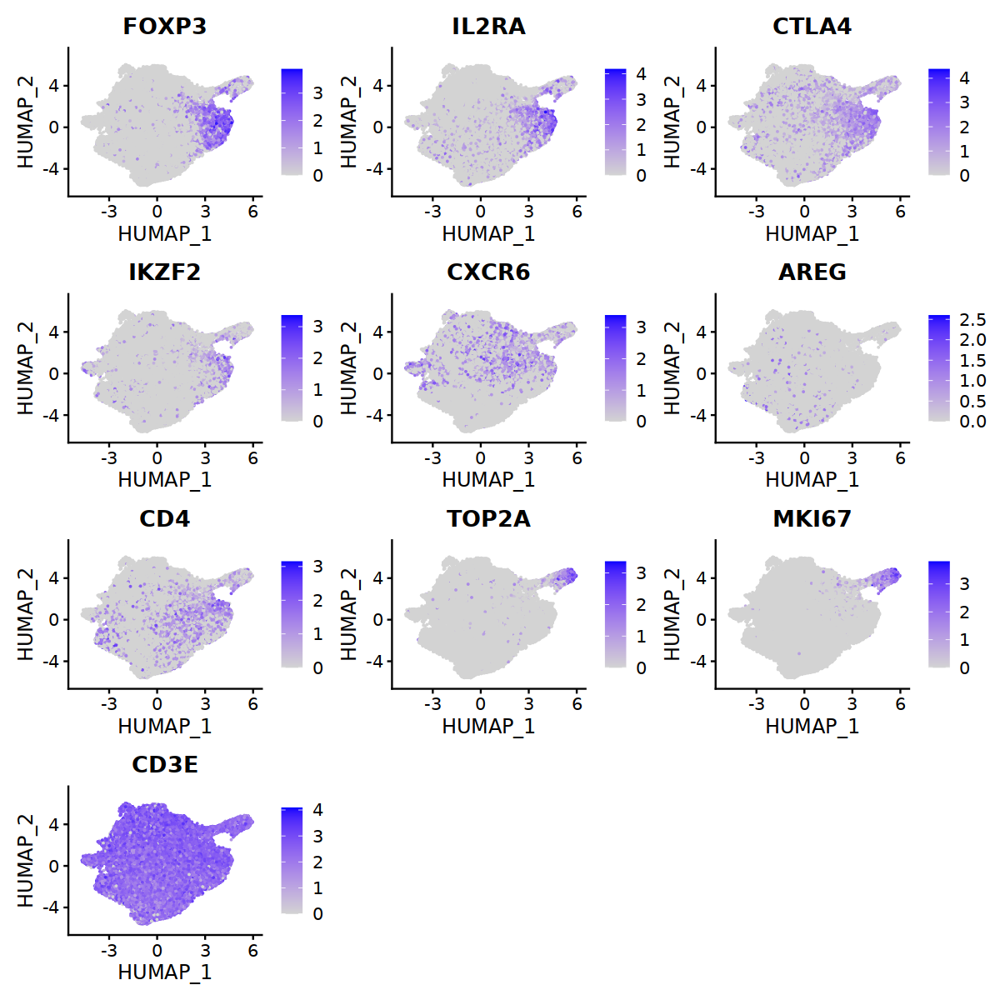

In [65]:
fig.size(10, 10)
FeaturePlot(obj, c("FOXP3", "IL2RA", "CTLA4", "IKZF2", "CXCR6", "AREG", "CD4", "TOP2A", "MKI67", "CD3E"), ncol = 3)

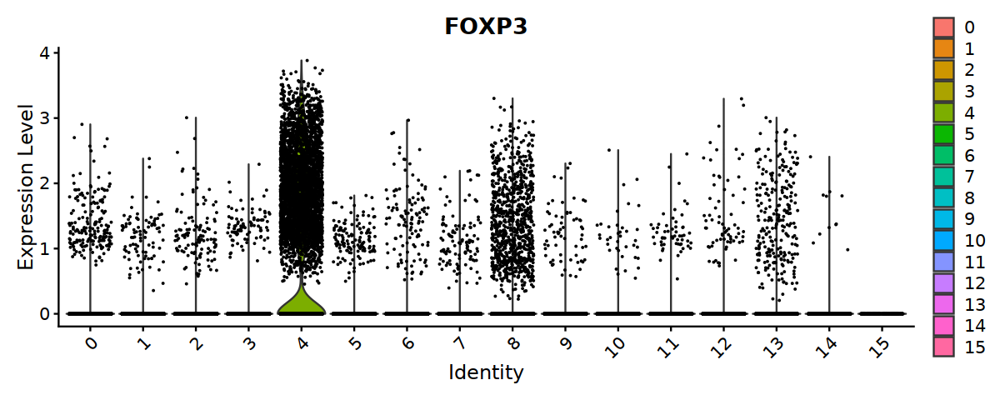

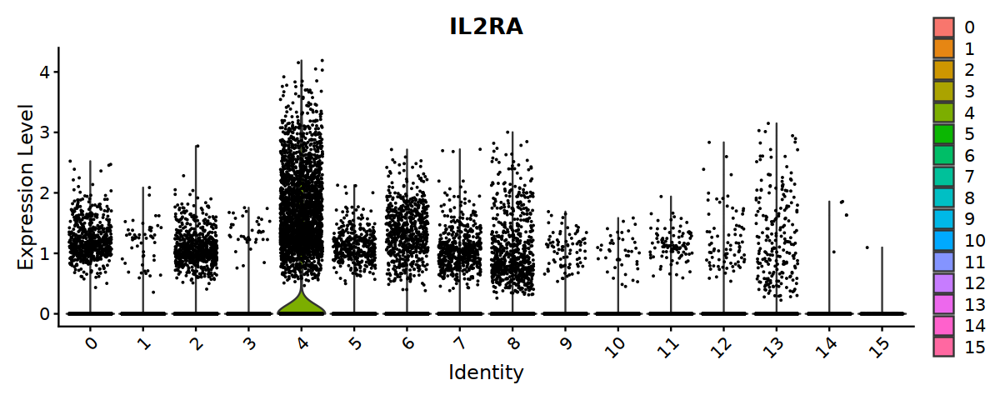

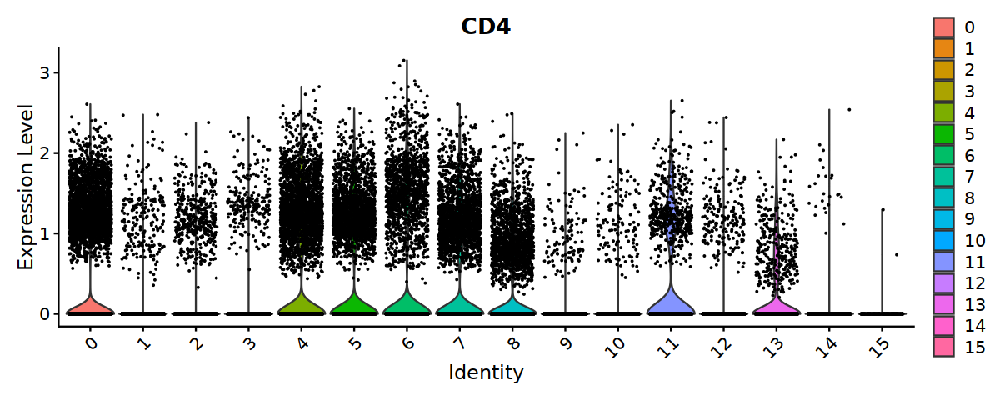

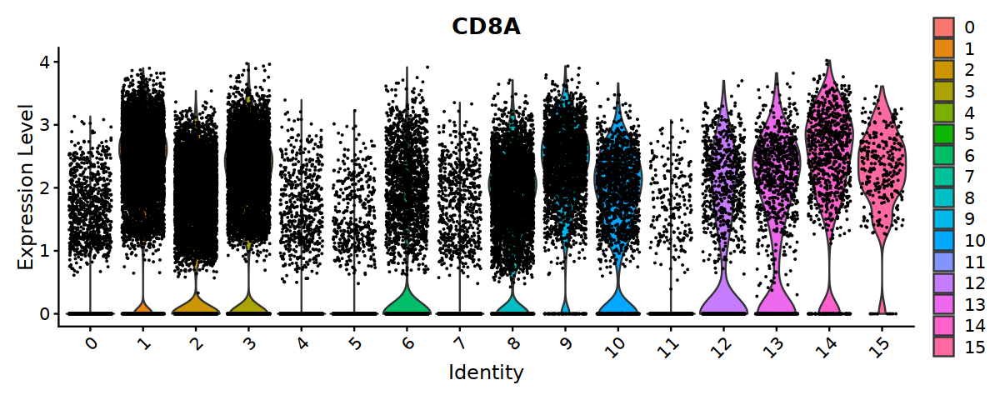

In [100]:
fig.size(4,10)
VlnPlot(obj, "FOXP3", group.by = "seurat_clusters")
VlnPlot(obj, "IL2RA", group.by = "seurat_clusters")
VlnPlot(obj, "CD4", group.by = "seurat_clusters")
VlnPlot(obj, "CD8A", group.by = "seurat_clusters")


In [133]:
#Subset to only Tregs
treg <- subset(obj, ident = c(4,7,11,8))

In [134]:
treg

An object of class Seurat 
33694 features across 16112 samples within 1 assay 
Active assay: RNA (33694 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 3 dimensional reductions calculated: pca, harmony, humap

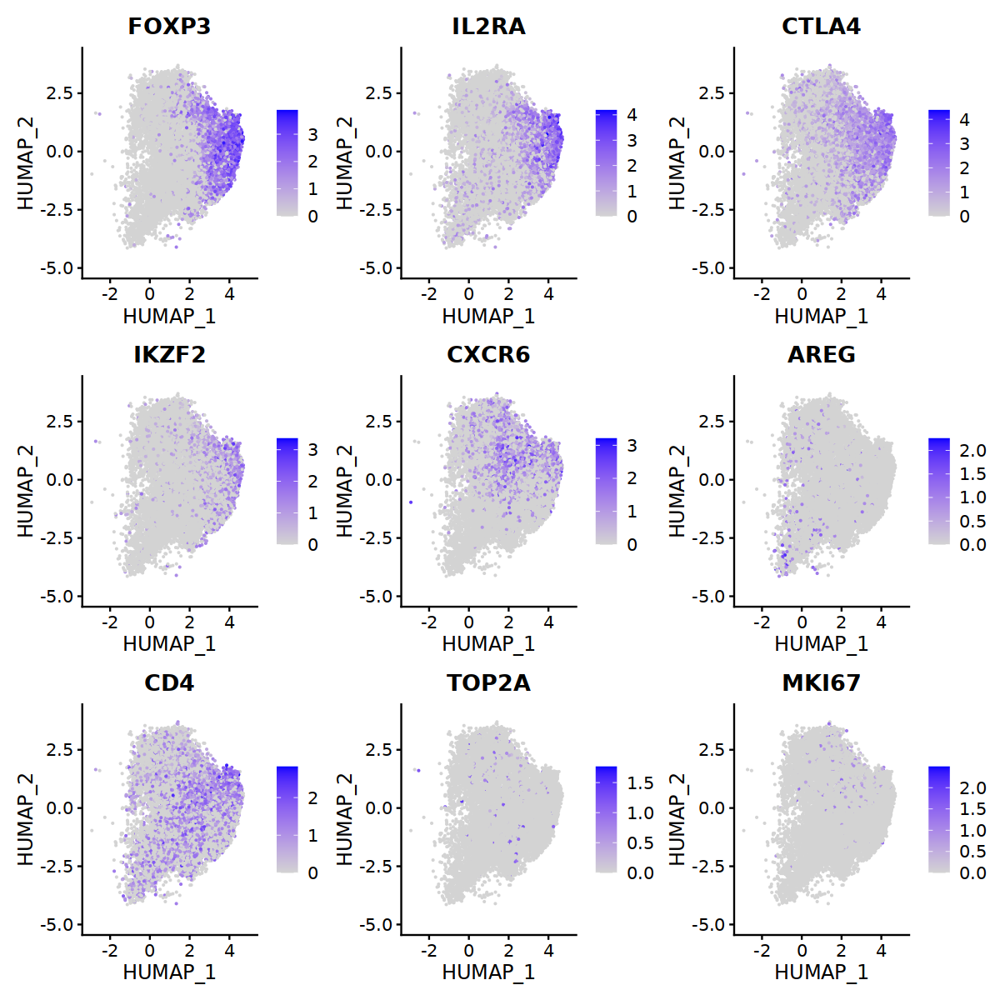

In [135]:
fig.size(10, 10)
FeaturePlot(treg, c("FOXP3", "IL2RA", "CTLA4", "IKZF2", "CXCR6", "AREG", "CD4", "TOP2A", "MKI67"), ncol = 3)

## Redo Normalization, dimeReduce and clustering

In [136]:
treg<- NormalizeData(treg, normalization.method = "LogNormalize", scale.factor = 10000, verbose = F) %>% 
    FindVariableFeatures(selection.method = "vst", nfeatures = 2000, verbose = F) %>% 
    ScaleData() %>% 
    RunPCA(verbose = F)

Centering and scaling data matrix



Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



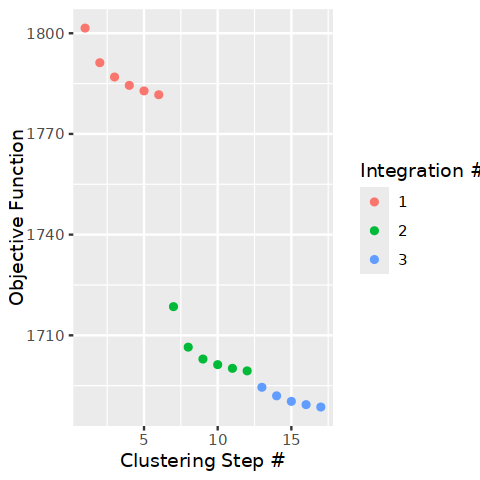

In [137]:
fig.size(4,4)
set.seed(1)
treg <- RunHarmony(treg, group.by.vars=c("donorID", "tissue"), reduction.use = "pca", 
                 plot_convergence = TRUE, max_iter = 10,
                 early_stop = T)

# ElbowPlot(treg, ndims = 50, reduction = "harmony") 
# ElbowPlot(treg, ndims = 50, reduction = "pca") 

In [138]:
set.seed(1)
treg <- Run_uwot_umap(treg)
treg <- FindClusters(treg, graph.name = 'humap_fgraph', resolution = 1, verbose = TRUE)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 16112
Number of edges: 193376

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7241
Number of communities: 11
Elapsed time: 1 seconds


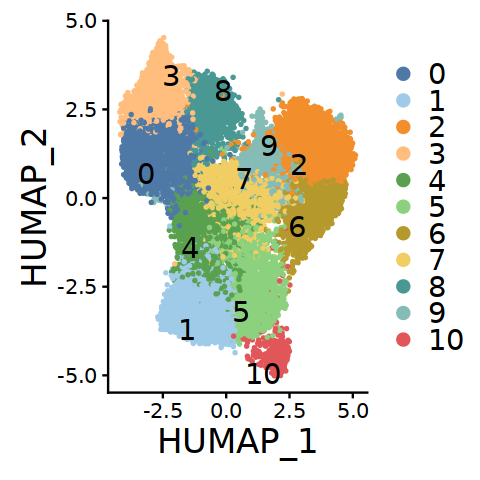

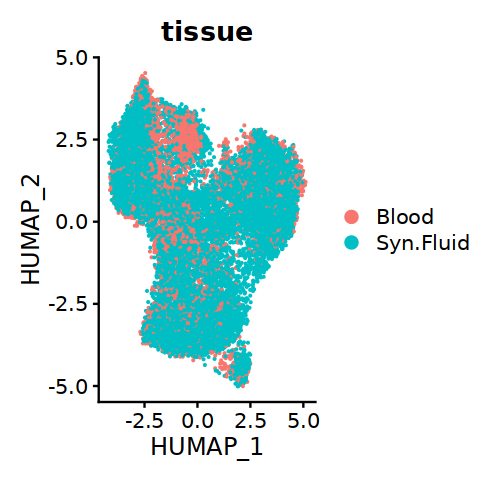

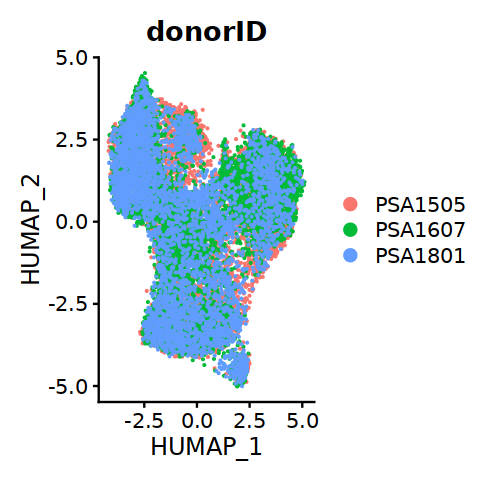

In [139]:
DimPlot(treg, label = T, repel = T, pt.size = 0.5, label.size = 6) + 
  scale_color_tableau("Tableau 20") + theme(text = element_text(size = 20))
DimPlot(treg, group.by = "tissue")
DimPlot(treg, group.by = "donorID")

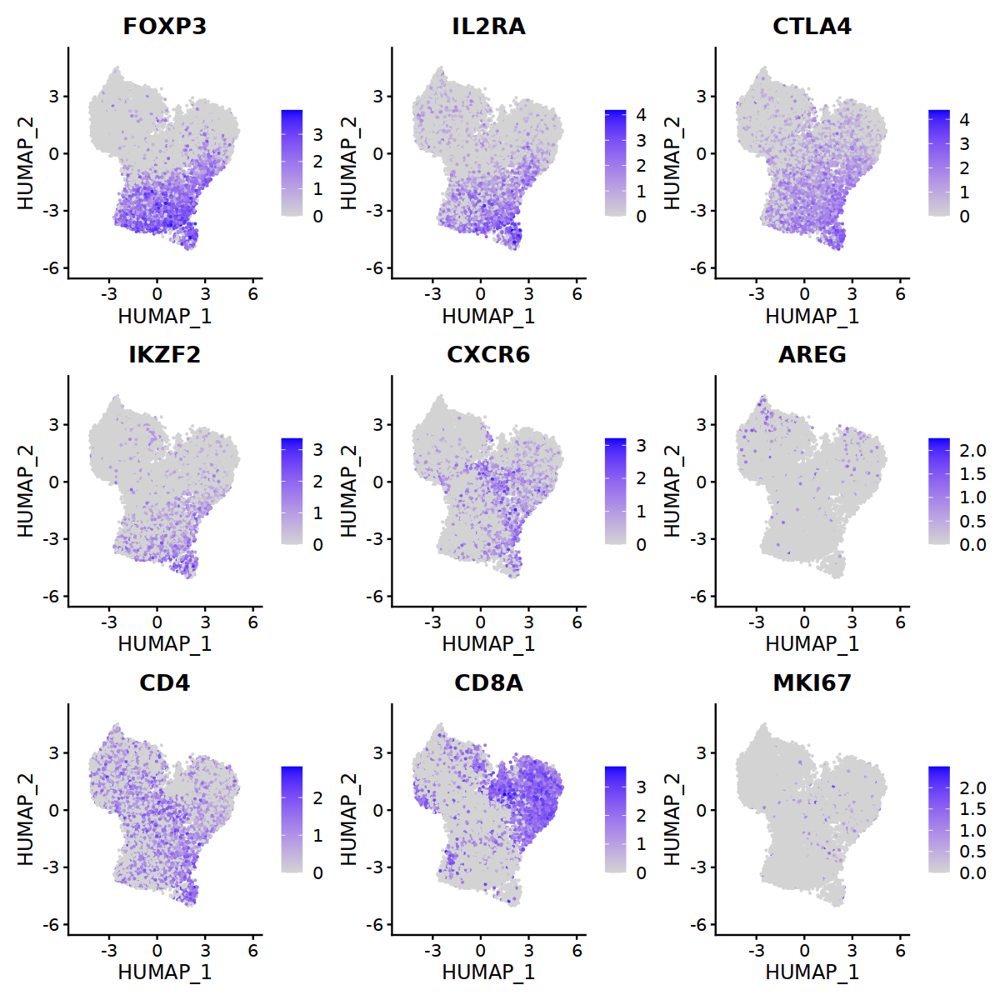

In [140]:
fig.size(10, 10)
FeaturePlot(treg, c("FOXP3", "IL2RA", "CTLA4", "IKZF2", "CXCR6", "AREG", "CD4", "CD8A", "MKI67"), ncol = 3)

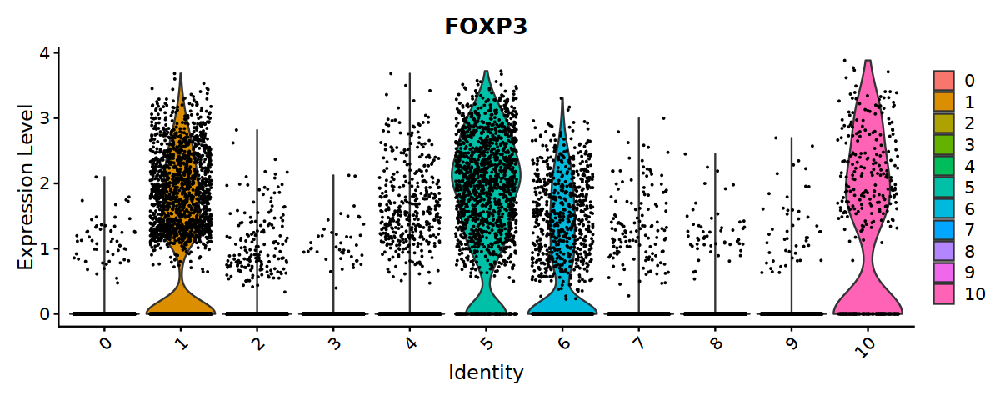

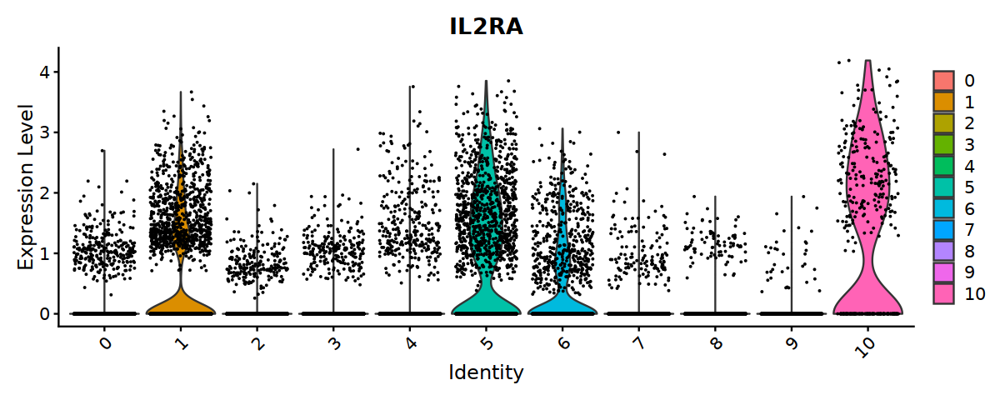

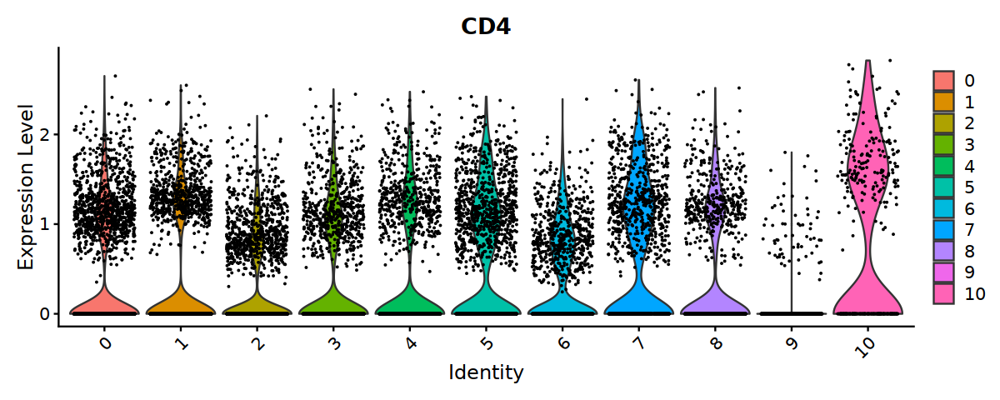

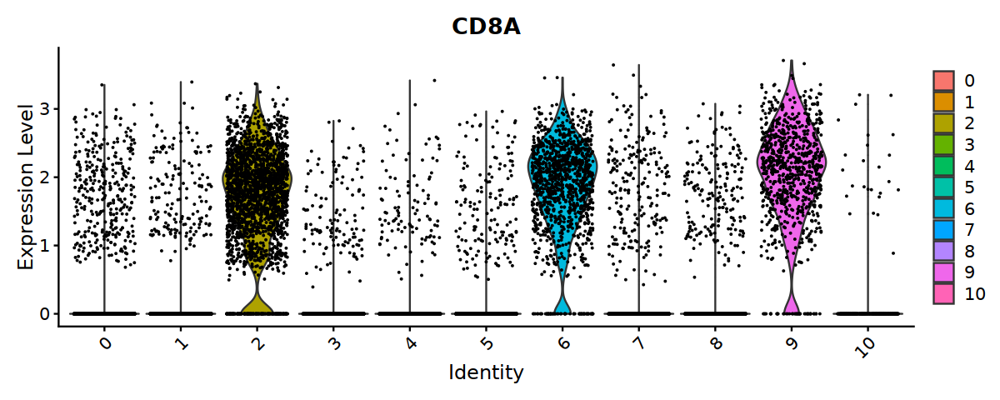

In [141]:
fig.size(4,10)
VlnPlot(treg, "FOXP3", group.by = "seurat_clusters")
VlnPlot(treg, "IL2RA", group.by = "seurat_clusters")
VlnPlot(treg, "CD4", group.by = "seurat_clusters")
VlnPlot(treg, "CD8A", group.by = "seurat_clusters")

In [142]:
treg <- FindSubCluster(treg, cluster = "4", graph.name = 'humap_fgraph', resolution = 0.3)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1567
Number of edges: 13982

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7588
Number of communities: 3
Elapsed time: 0 seconds


In [143]:
Idents(treg) <- "sub.cluster"
treg <- FindSubCluster(treg, cluster = "6", graph.name = 'humap_fgraph', resolution = 0.5)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1147
Number of edges: 10403

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6524
Number of communities: 4
Elapsed time: 0 seconds


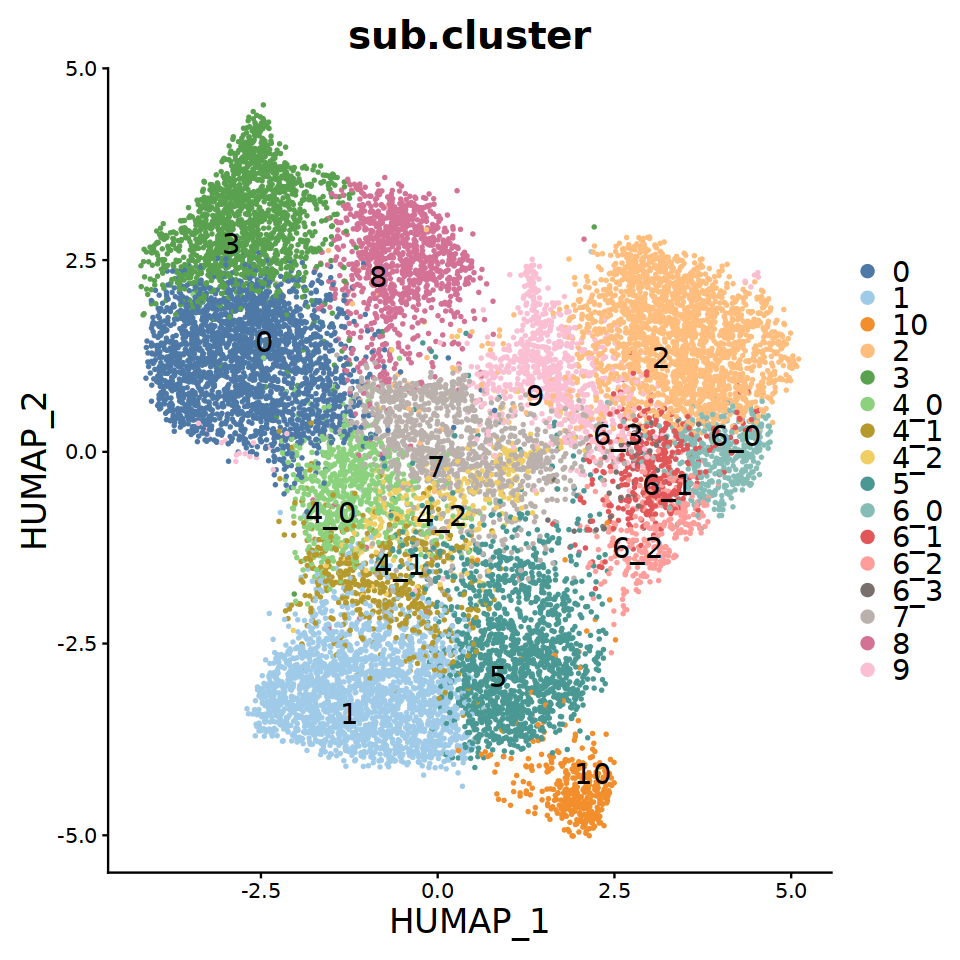

In [144]:
fig.size(8,8)
DimPlot(treg, label = T, repel = T, pt.size = 0.5, label.size = 6, group.by = "sub.cluster") + 
  scale_color_tableau("Tableau 20") + theme(text = element_text(size = 20))

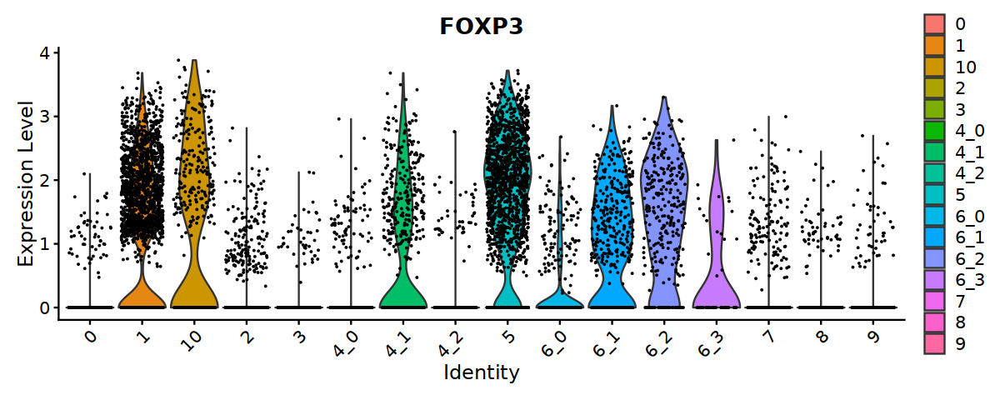

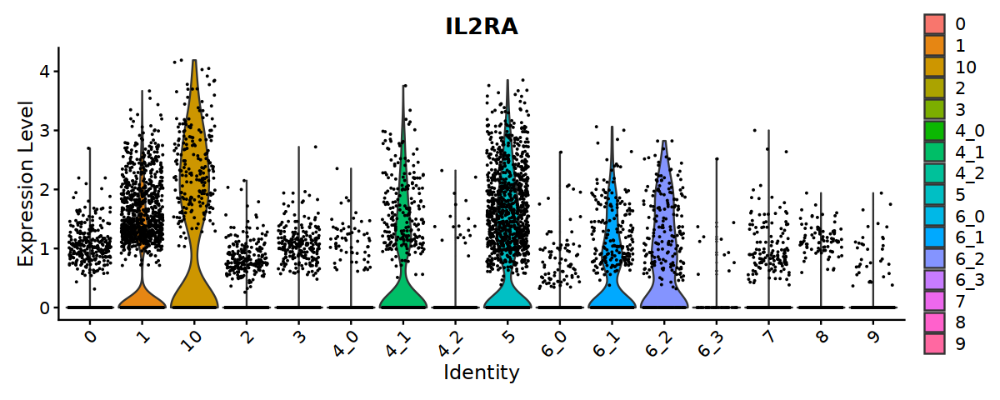

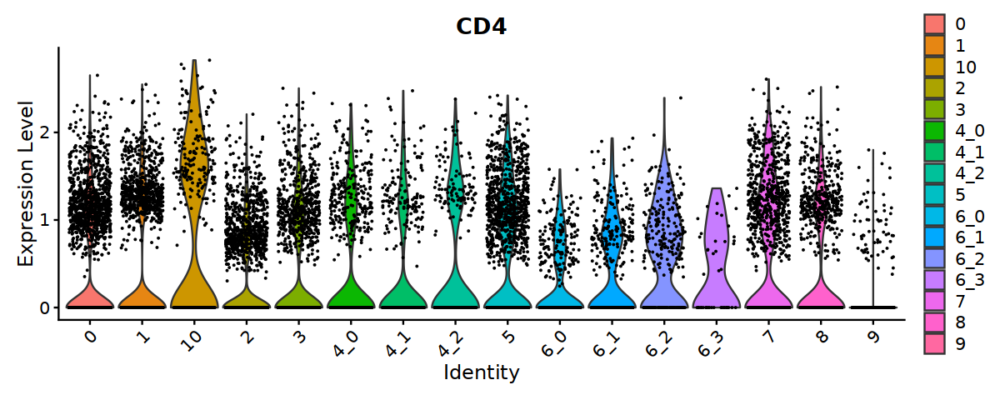

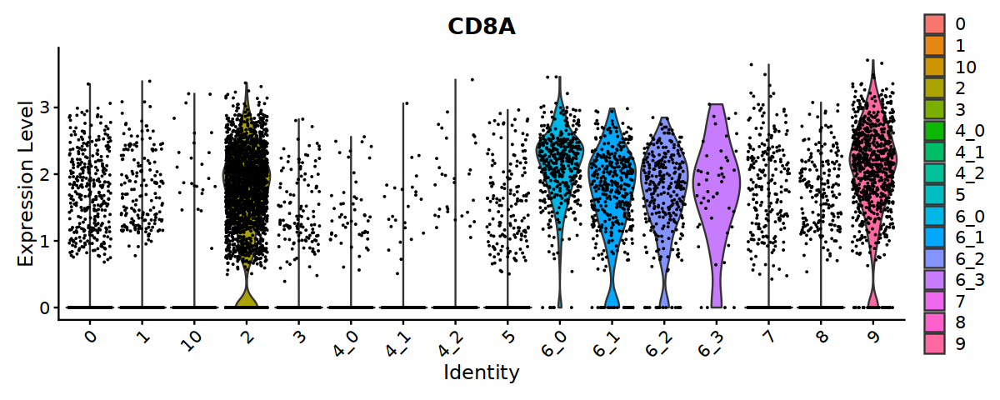

In [145]:
fig.size(4,10)
VlnPlot(treg, "FOXP3", group.by = "sub.cluster")
VlnPlot(treg, "IL2RA", group.by = "sub.cluster")
VlnPlot(treg, "CD4", group.by = "sub.cluster")
VlnPlot(treg, "CD8A", group.by = "sub.cluster")


In [146]:
#Subset to only Tregs
Idents(treg) <- "sub.cluster"
treg <- subset(treg, ident = c(1, "4_1", 5,10))

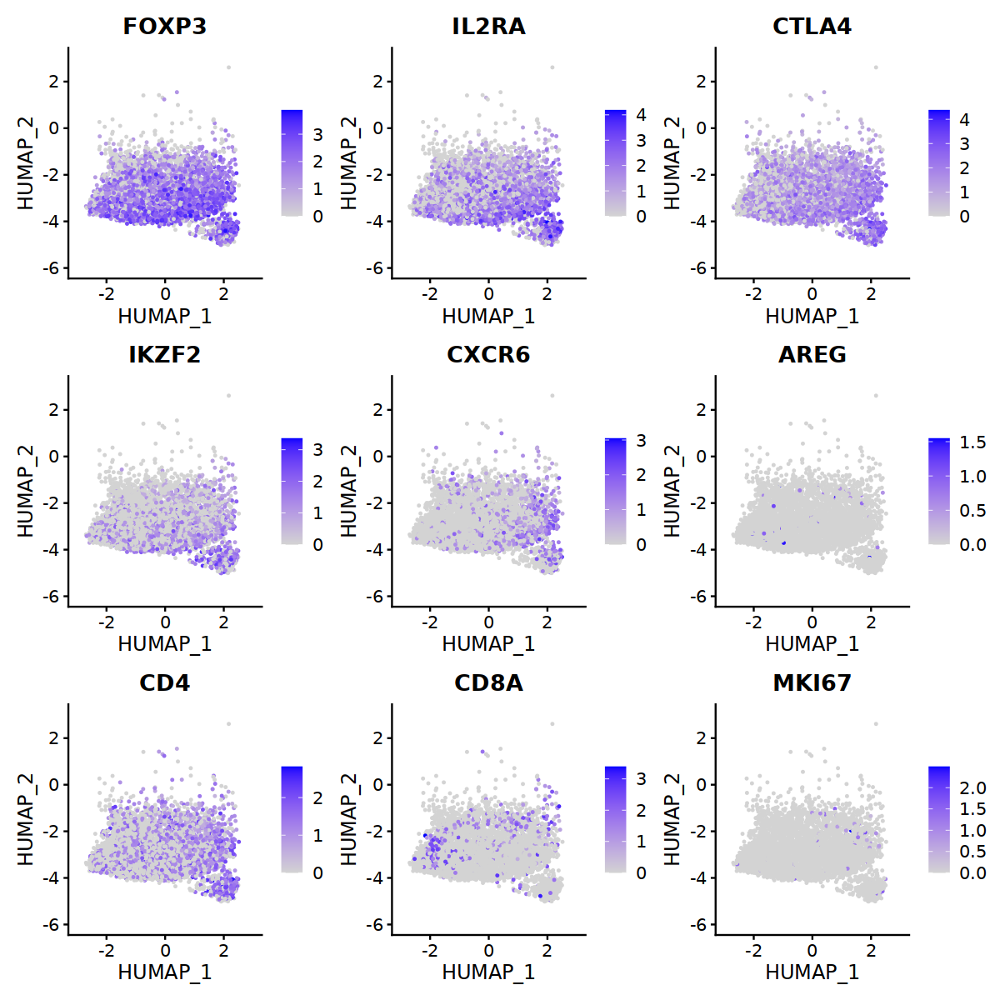

In [147]:
fig.size(10, 10)
FeaturePlot(treg, c("FOXP3", "IL2RA", "CTLA4", "IKZF2", "CXCR6", "AREG", "CD4", "CD8A", "MKI67"), ncol = 3)

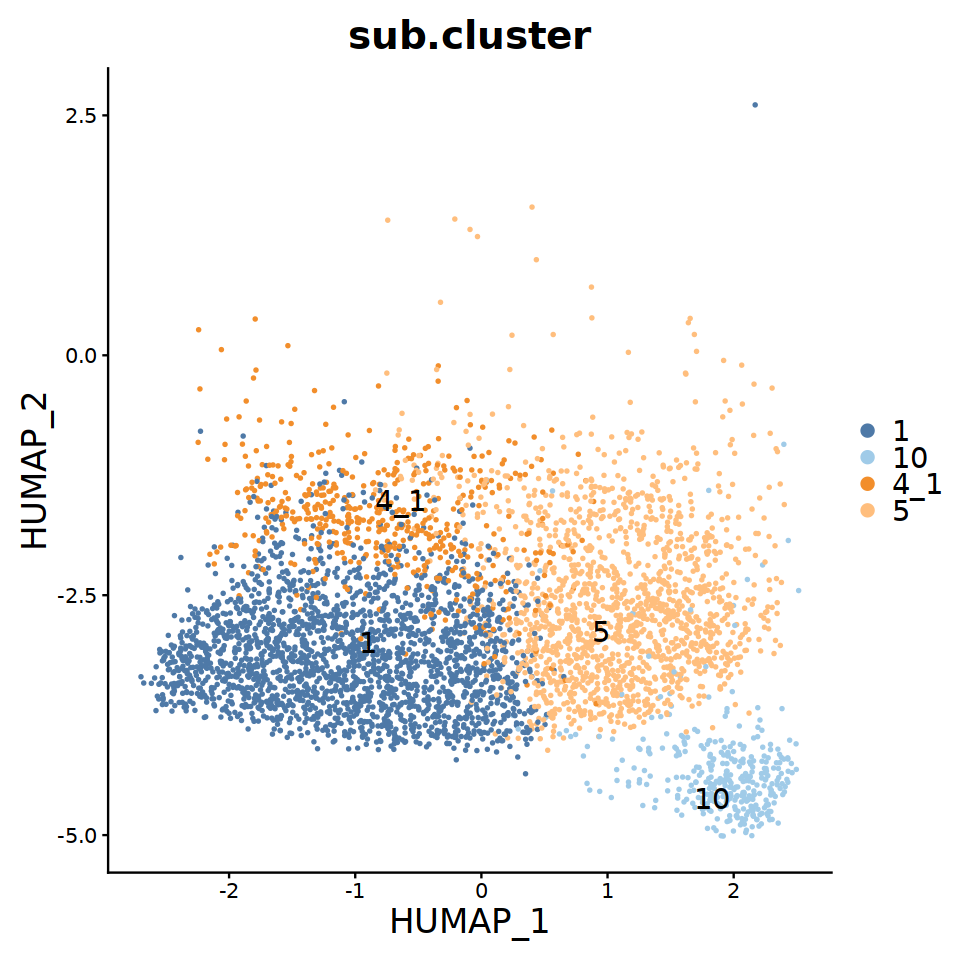

In [148]:
fig.size(8,8)
DimPlot(treg, label = T, repel = T, pt.size = 0.5, label.size = 6, group.by = "sub.cluster") + 
  scale_color_tableau("Tableau 20") + theme(text = element_text(size = 20))

### Redo Normalization, dimeReduce and clustering

In [149]:
treg<- NormalizeData(treg, normalization.method = "LogNormalize", scale.factor = 10000, verbose = F) %>% 
    FindVariableFeatures(selection.method = "vst", nfeatures = 2000, verbose = F) %>% 
    ScaleData() %>% 
    RunPCA(verbose = F)

Centering and scaling data matrix



Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony 8/10

Harmony 9/10

Harmony 10/10



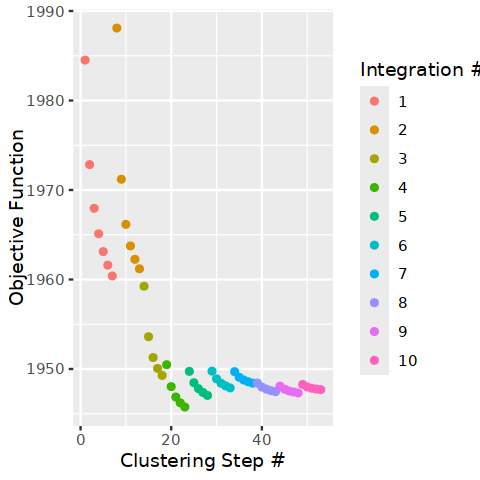

In [150]:
fig.size(4,4)
set.seed(1)
treg <- RunHarmony(treg, group.by.vars=c("donorID", "tissue"), reduction.use = "pca", 
                 plot_convergence = TRUE, #max_iter = 10,
                 early_stop = F)

# ElbowPlot(treg, ndims = 50, reduction = "harmony") 
# ElbowPlot(treg, ndims = 50, reduction = "pca") 

In [151]:
set.seed(1)
treg <- Run_uwot_umap(treg)
treg <- FindClusters(treg, graph.name = 'humap_fgraph', resolution = 0.8, verbose = TRUE)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 4623
Number of edges: 56791

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.6613
Number of communities: 9
Elapsed time: 0 seconds


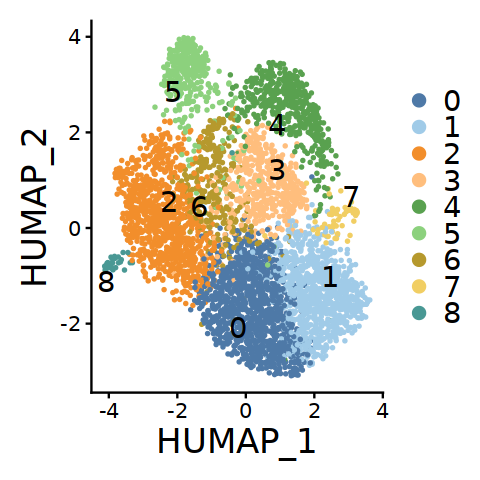

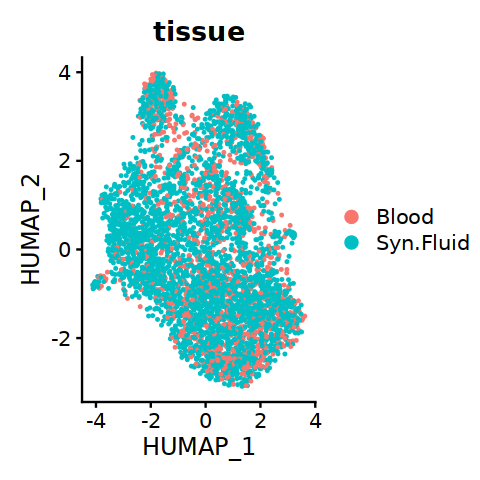

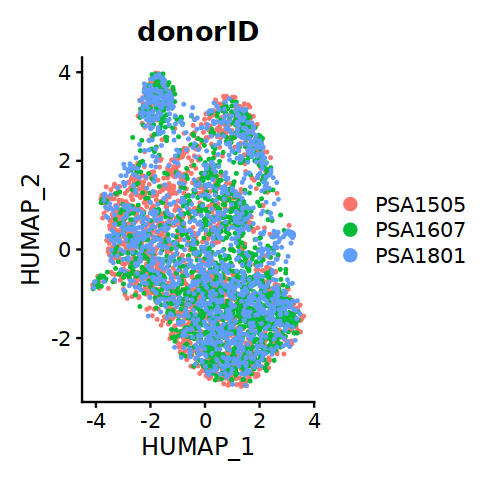

In [152]:
DimPlot(treg, label = T, repel = T, pt.size = 0.5, label.size = 6) + 
  scale_color_tableau("Tableau 20") + theme(text = element_text(size = 20))
DimPlot(treg, group.by = "tissue")
DimPlot(treg, group.by = "donorID")

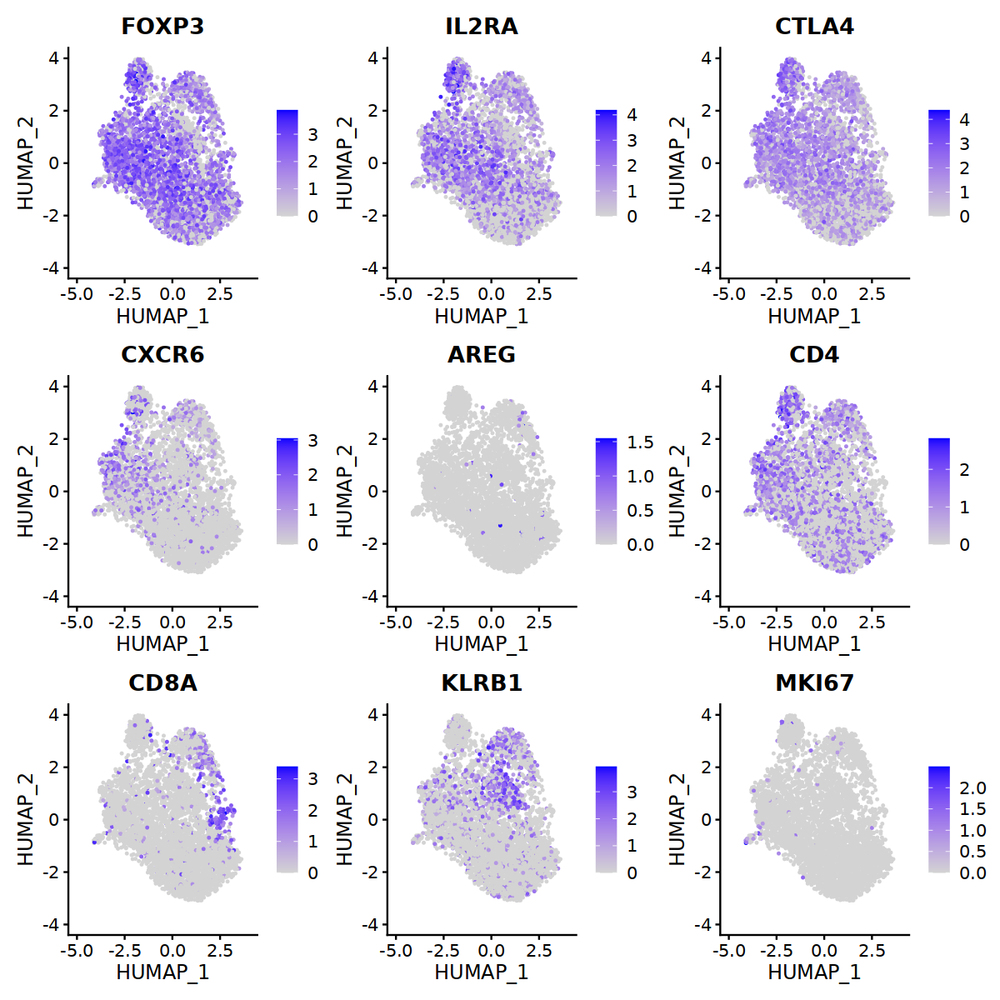

In [153]:
fig.size(10, 10)
FeaturePlot(treg, c("FOXP3", "IL2RA", "CTLA4", "CXCR6", "AREG", "CD4", "CD8A", "KLRB1", "MKI67"), ncol = 3)

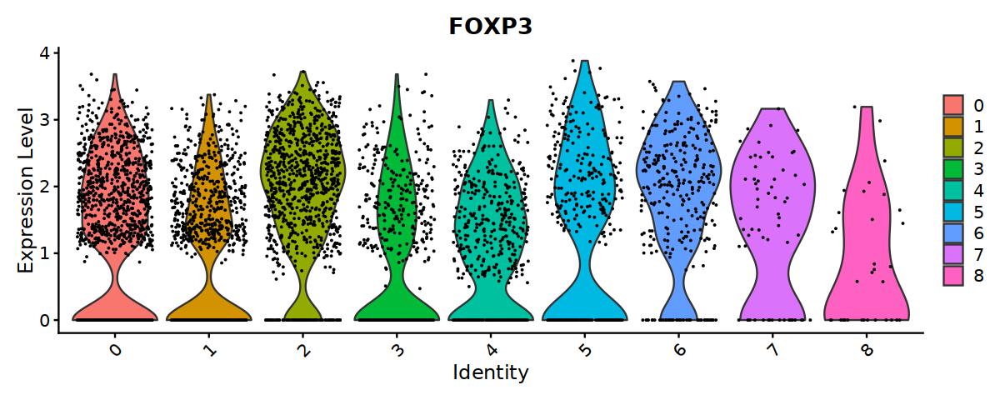

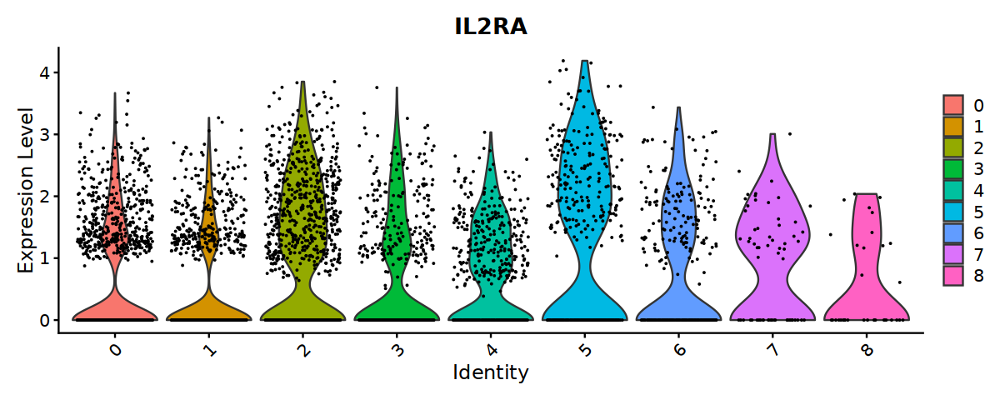

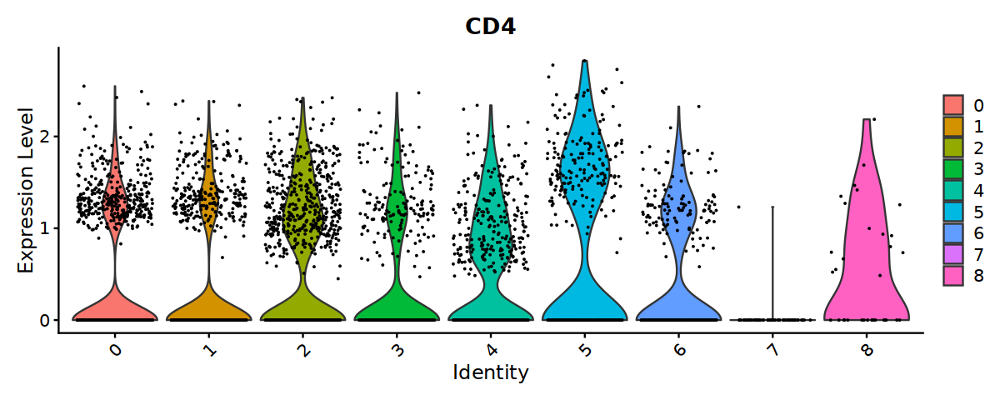

In [154]:
fig.size(4,10)
VlnPlot(treg, "FOXP3", group.by = "seurat_clusters")
VlnPlot(treg, "IL2RA", group.by = "seurat_clusters")
VlnPlot(treg, "CD4", group.by = "seurat_clusters")

In [155]:
treg <- FindSubCluster(treg, cluster = "4", graph.name = 'humap_fgraph', resolution = 0.3)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 465
Number of edges: 4560

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7000
Number of communities: 1
Elapsed time: 0 seconds


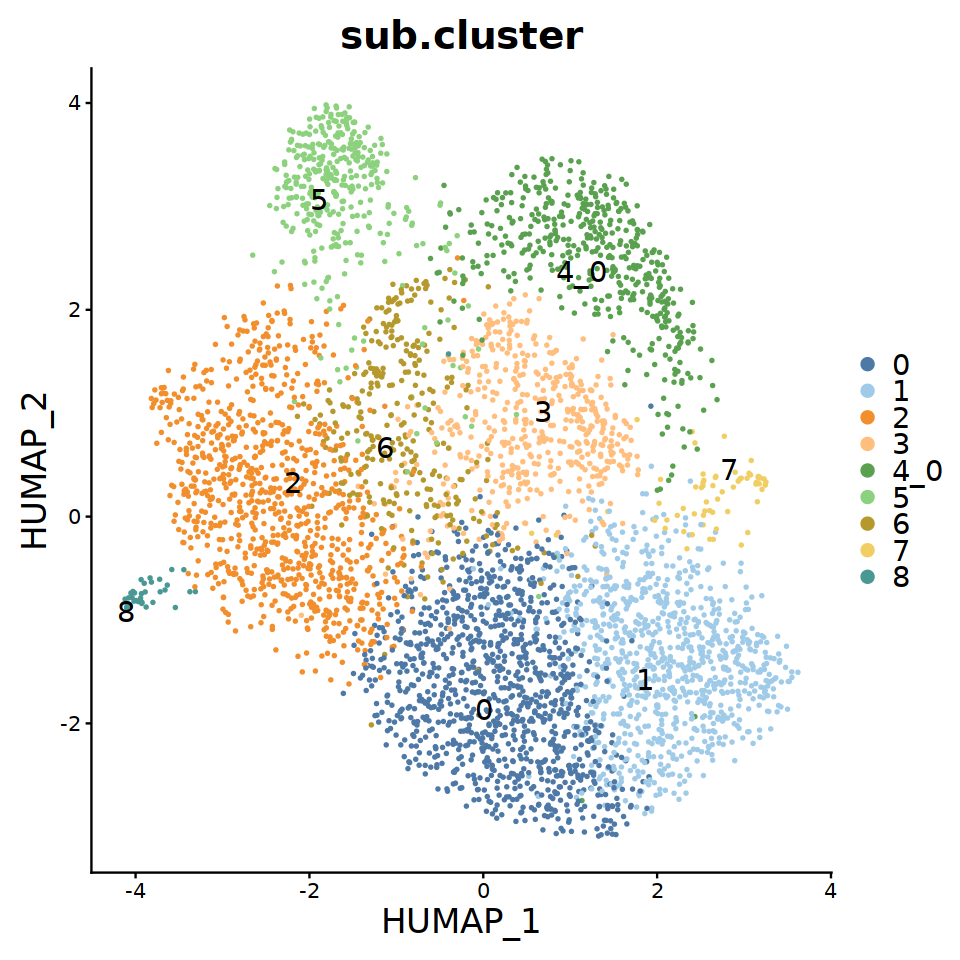

In [156]:
fig.size(8,8)
DimPlot(treg, label = T, repel = T, pt.size = 0.5, label.size = 6, group.by = "sub.cluster") + 
  scale_color_tableau("Tableau 20") + theme(text = element_text(size = 20))

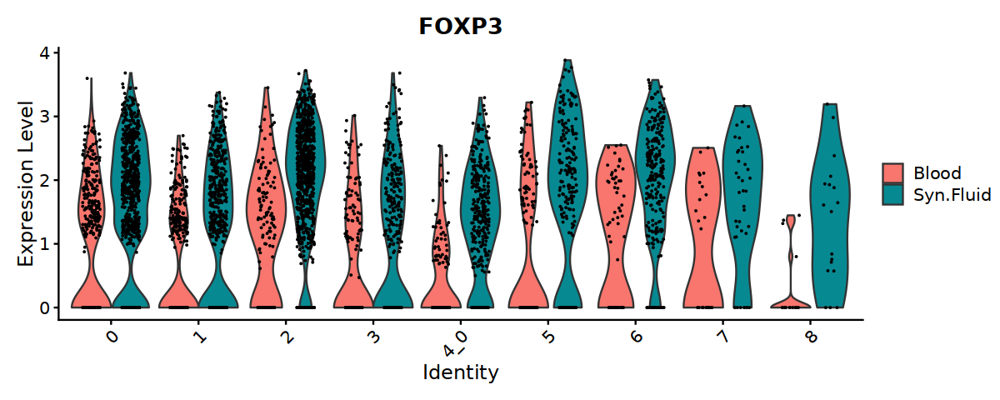

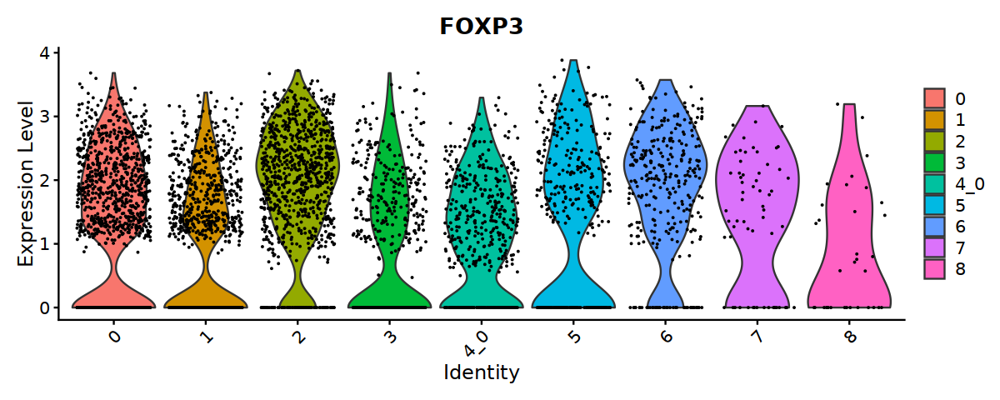

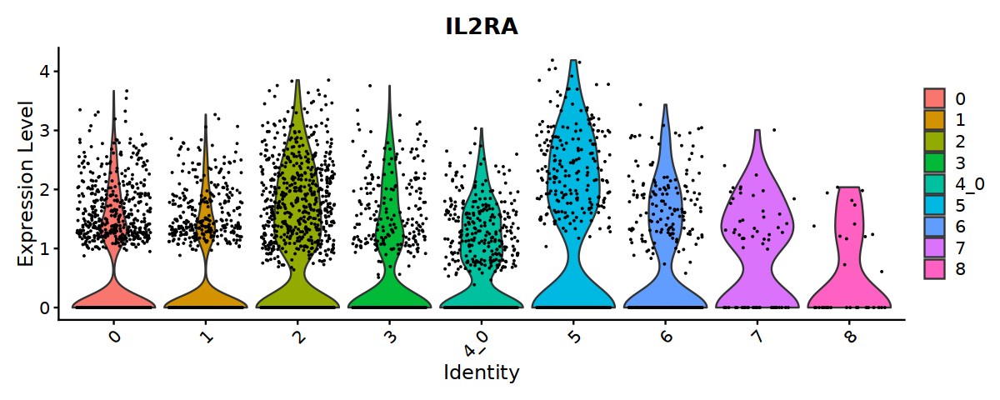

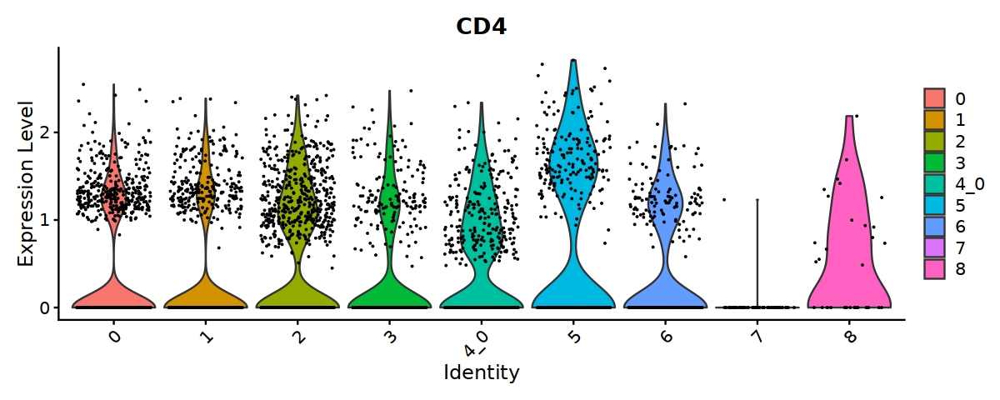

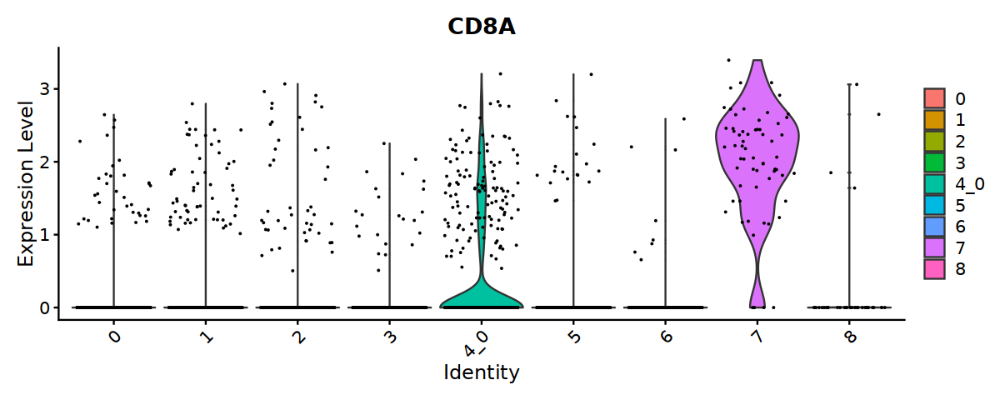

In [157]:
fig.size(4,10)
VlnPlot(treg, "FOXP3", group.by = "sub.cluster", split.by = "tissue")

VlnPlot(treg, "FOXP3", group.by = "sub.cluster")
VlnPlot(treg, "IL2RA", group.by = "sub.cluster")
VlnPlot(treg, "CD4", group.by = "sub.cluster")
VlnPlot(treg, "CD8A", group.by = "sub.cluster")

In [158]:
treg <- subset(treg, ident = c(4, 7), invert = T)

In [159]:
treg

An object of class Seurat 
33694 features across 4096 samples within 1 assay 
Active assay: RNA (33694 features, 2000 variable features)
 3 layers present: counts, data, scale.data
 3 dimensional reductions calculated: pca, harmony, humap

## Save Obj.

In [160]:
saveRDS(treg, "/data/brennerlab/Shani/projects/Treg/analysis/Treg_nonRA/PsA_Tregs.RDS")
#treg <- readRDS("/data/brennerlab/Shani/projects/Treg/analysis/Treg_nonRA/PsA_Tregs.RDS")

## Map to RA tregs with symphony

In [161]:
ref <- "/data/brennerlab/Shani/projects/Treg/analysis/integrated/integrated_Tregs_SymphonyRef.rds"
tregRef<- readRDS(ref)

In [162]:
query = mapQuery(treg@assays$RNA@counts,             # query gene expression (genes x cells)
                 treg@meta.data,        # query metadata (cells x attributes)
                 tregRef,             # Symphony reference object
                 vars = c("donorID"),           # Query batch variables to harmonize over (NULL treats query as one batch)
                 do_normalize = FALSE,  # perform log(CP10k) normalization on query (set to FALSE if already normalized)
                 do_umap = TRUE)        # project query cells into reference UMAP

Scaling and synchronizing query gene expression

Found 1704 out of 2000 reference variable genes in query dataset

Project query cells using reference gene loadings

Clustering query cells to reference centroids

Correcting query batch effects

UMAP

All done!



In [163]:
summary(query)

          Length    Class      Mode   
exp       138010624 dgCMatrix  S4     
meta_data        10 data.frame list   
Z            204800 -none-     numeric
Zq_pca       204800 -none-     numeric
R            409600 -none-     numeric
Xq            16384 -none-     numeric
umap           8192 -none-     numeric

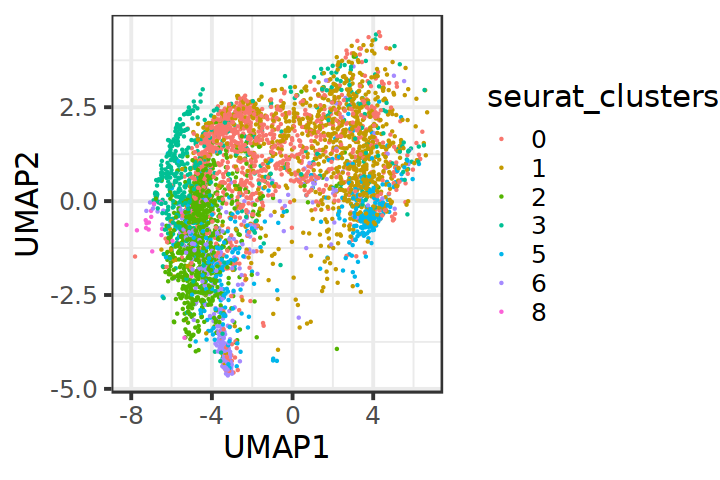

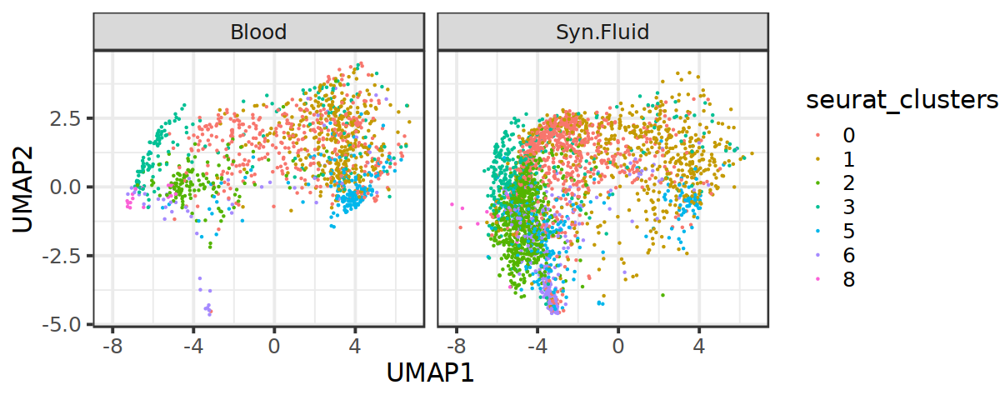

In [164]:
fig.size(4,6)
qp <- query$umap %>% as.data.frame %>% cbind(query$meta_data) %>% 
ggplot(aes(x=UMAP1, y=UMAP2, color=seurat_clusters)) + geom_point(size = 0.2) + 
theme_bw(base_size = 18) 

qp
fig.size(4,10)
qp + facet_wrap(facets = vars(tissue))

In [165]:
# Predict query cell types
query <- knnPredict(query, tregRef, 
                   train_labels = tregRef$meta_data$cell.states, 
                   k = 30, 
                   confidence = TRUE) # calculate prediction confidence

In [166]:
query$meta_data %>% head

,orig.ident,donorID,tissue,nCount_RNA,nFeature_RNA,percent.mito,humap_fgraph_res.1,seurat_clusters,sub.cluster,humap_fgraph_res.0.8,cell_type_pred_knn,cell_type_pred_knn_prob
,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<chr>,<fct>,<fct>,<dbl>
AAACCTGGTCACTGGC-1_1,PSA1505_PBMC,PSA1505,Blood,3987,1635,3.110108,1,0,0,0,GZM Treg,0.6333333
AAACCTGGTGTAAGTA-1_1,PSA1505_PBMC,PSA1505,Blood,5759,2102,2.569891,4,3,3,3,CD161+mem. Treg,0.5000000
AAACCTGGTTGAACTC-1_1,PSA1505_PBMC,PSA1505,Blood,5562,1917,3.559871,1,0,0,0,CD25int Treg,0.9000000
AAACGGGCAGTATAAG-1_1,PSA1505_PBMC,PSA1505,Blood,4727,1774,2.136662,4,3,3,3,Naive Treg,0.6333333
AAAGCAAGTAAGGATT-1_1,PSA1505_PBMC,PSA1505,Blood,6302,2158,2.999048,5,2,2,2,CD25high Treg,1.0000000
AAAGTAGTCGAGGTAG-1_1,PSA1505_PBMC,PSA1505,Blood,4698,1805,2.830992,4,3,3,3,CD161+mem. Treg,0.9333333


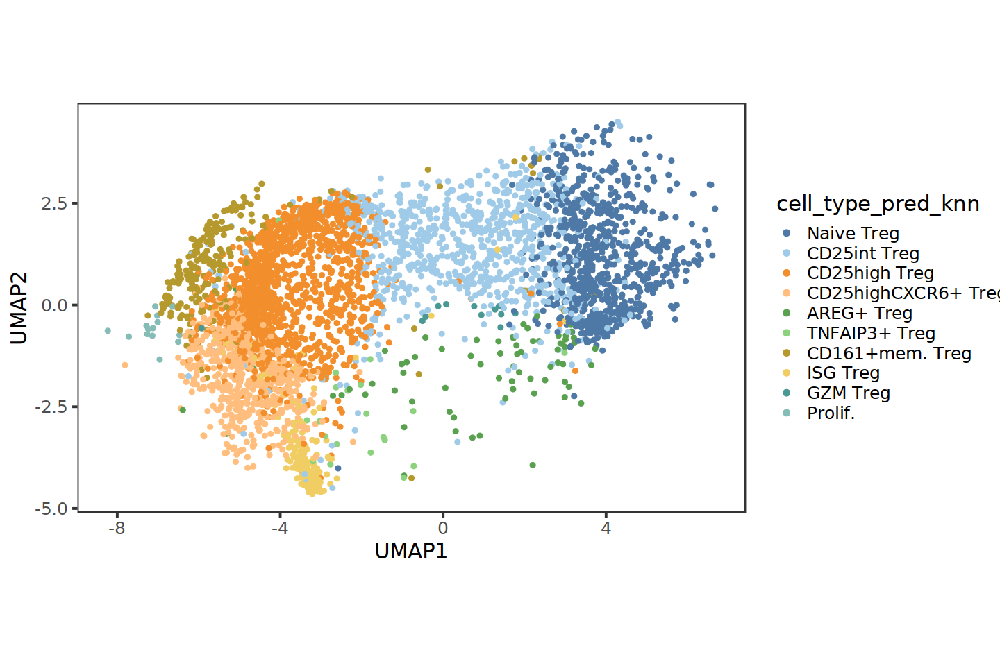

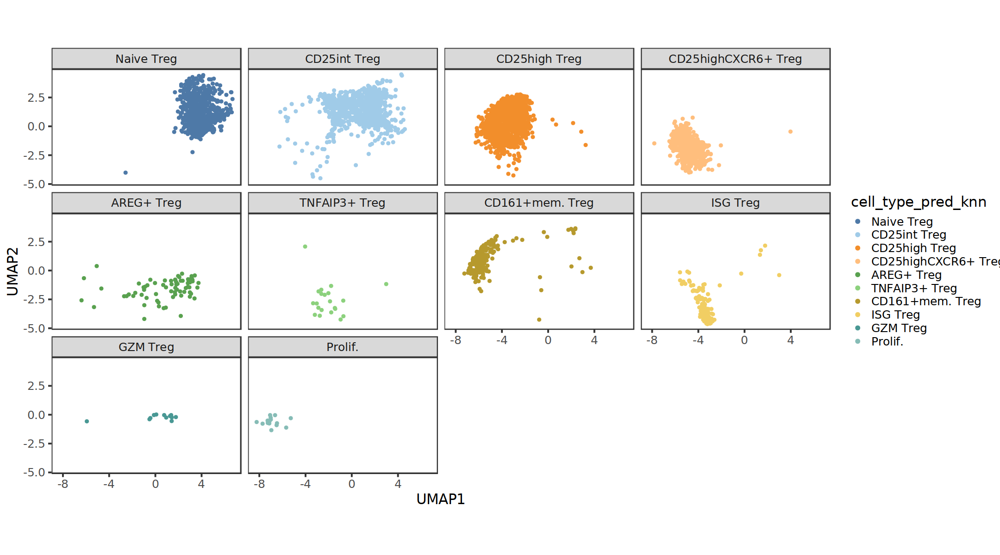

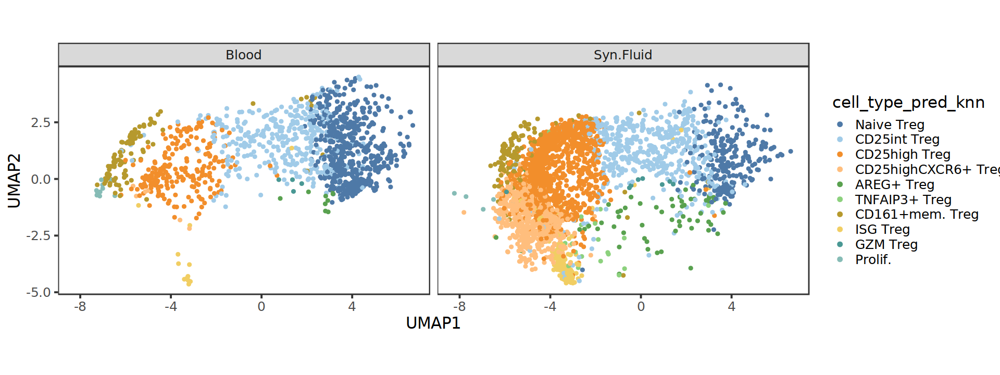

In [170]:
fig.size(8, 12)
qp <- query$umap %>% as.data.frame %>% cbind(query$meta_data) %>% 
ggplot(aes(x=UMAP1, y=UMAP2, color=cell_type_pred_knn)) + geom_point() + 
theme_bw(base_size = 18) + guides(colour = guide_legend(override.aes = list(size=2))) + 
scale_color_manual(values = cell.state.colors.v2$cell.states) + 
theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank()) +coord_fixed()

qp
fig.size(10,18)
qp + facet_wrap(facets = vars(cell_type_pred_knn))
fig.size(6, 16)
qp + facet_wrap(facets = vars(tissue))


In [182]:
count.groups <- query$meta_data %>% select(cell_type_pred_knn, tissue, orig.ident) %>% 
group_by(cell_type_pred_knn, tissue, orig.ident) %>% mutate(n = n()) %>% 
ungroup() %>% group_by(orig.ident) %>% mutate(totalN  = n()) %>% 
mutate(prop = n/totalN) %>% 
group_by(cell_type_pred_knn, tissue) %>% summarize(mean_n = mean(prop)) #, .groups = 'drop')

`summarise()` has grouped output by 'cell_type_pred_knn'. You can override
using the `.groups` argument.


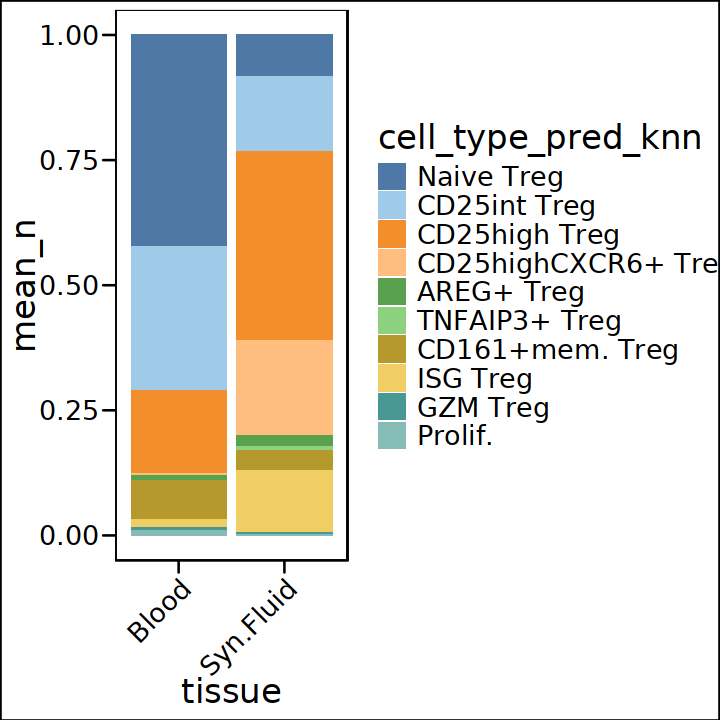

In [184]:
fig.size(6,6)
# count.groups <- query$meta_data %>% select(cell_type_pred_knn, condition) %>% group_by(cell_type_pred_knn, condition) %>% mutate(n=n())
ggplot(count.groups, aes(x = tissue, y = mean_n, fill = cell_type_pred_knn)) +
       geom_col(position = "fill") + scale_fill_manual(values = cell.state.colors.v2$cell.states) + 
theme_base(base_size = 20) + theme(axis.text.x = element_text(angle = 45, hjust = 1))

### Add symphony results to Seurat

In [173]:
mt<- treg@meta.data %>% tibble::rownames_to_column("rownames") %>% 
left_join(query$meta_data %>% tibble::rownames_to_column("rownames"), by = join_by(rownames))
mt %>% head

,rownames,orig.ident.x,donorID.x,tissue.x,nCount_RNA.x,nFeature_RNA.x,percent.mito.x,humap_fgraph_res.1.x,seurat_clusters.x,sub.cluster.x,humap_fgraph_res.0.8.x,orig.ident.y,donorID.y,tissue.y,nCount_RNA.y,nFeature_RNA.y,percent.mito.y,humap_fgraph_res.1.y,seurat_clusters.y,sub.cluster.y,humap_fgraph_res.0.8.y,cell_type_pred_knn,cell_type_pred_knn_prob
,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<chr>,<fct>,<chr>,<chr>,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<chr>,<fct>,<fct>,<dbl>
1,AAACCTGGTCACTGGC-1_1,PSA1505_PBMC,PSA1505,Blood,3987,1635,3.110108,1,0,0,0,PSA1505_PBMC,PSA1505,Blood,3987,1635,3.110108,1,0,0,0,GZM Treg,0.6333333
2,AAACCTGGTGTAAGTA-1_1,PSA1505_PBMC,PSA1505,Blood,5759,2102,2.569891,4,3,3,3,PSA1505_PBMC,PSA1505,Blood,5759,2102,2.569891,4,3,3,3,CD161+mem. Treg,0.5000000
3,AAACCTGGTTGAACTC-1_1,PSA1505_PBMC,PSA1505,Blood,5562,1917,3.559871,1,0,0,0,PSA1505_PBMC,PSA1505,Blood,5562,1917,3.559871,1,0,0,0,CD25int Treg,0.9000000
4,AAACGGGCAGTATAAG-1_1,PSA1505_PBMC,PSA1505,Blood,4727,1774,2.136662,4,3,3,3,PSA1505_PBMC,PSA1505,Blood,4727,1774,2.136662,4,3,3,3,Naive Treg,0.6333333
5,AAAGCAAGTAAGGATT-1_1,PSA1505_PBMC,PSA1505,Blood,6302,2158,2.999048,5,2,2,2,PSA1505_PBMC,PSA1505,Blood,6302,2158,2.999048,5,2,2,2,CD25high Treg,1.0000000
6,AAAGTAGTCGAGGTAG-1_1,PSA1505_PBMC,PSA1505,Blood,4698,1805,2.830992,4,3,3,3,PSA1505_PBMC,PSA1505,Blood,4698,1805,2.830992,4,3,3,3,CD161+mem. Treg,0.9333333


In [174]:
## Add umap and cell state predictions to seurat obj.
treg@reductions[["umap"]] <- CreateDimReducObject(embeddings = query$umap[rownames(treg@meta.data),], 
                                                  key = "UMAP_", assay = DefaultAssay(treg))
treg <- AddMetaData(treg, mt$cell_type_pred_knn, "cell.states")
treg <- AddMetaData(treg, mt$cell_type_pred_knn_prob, "cell.states.knn.prob")


In [176]:
saveRDS(query, "/data/brennerlab/Shani/projects/Treg/analysis/Treg_nonRA/PsA_Tregs_symphony.RDS")
saveRDS(treg, "/data/brennerlab/Shani/projects/Treg/analysis/Treg_nonRA/PsA_Tregs_symphony_Seurat.RDS")
